<a href="https://colab.research.google.com/github/kamblechand/capstone-project-3--mobile-price-range-prediction/blob/main/mobile_price_range_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - 



##### **Project Type**    - Classification
##### **Contribution**    - Individual
#### Chand Kamble.



# **Project Summary -**

Write the summary here within 500-600 words.

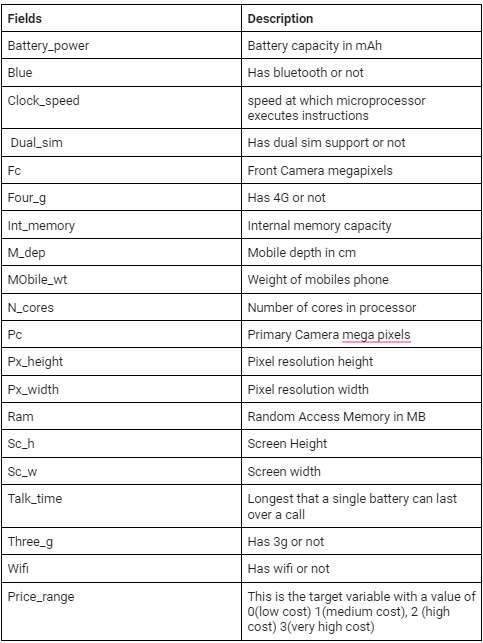


First we do Exploratory Data Analysis on the data set. We look for missing data values,duplicates values (none were found) and outliers and appropriately modify them. we have seen relation b/w numeric features and dependent variables and seen different price range in the terms of ram,bluetooth supported or not, battery power, wifi supported or not etc.We checked the data is balanced or not, We also perform correlation analysis to extract out the important and relevant feature set and later perform feature engineering to modify few existing columns and drop out irrelavant ones.we normilized the independent features through mini-max scaler and later we have done hypothesis testing where we find out the p value using F-test and seen whether the null hypothesis is rejected or not.

We then look at several popular individual models from simple ones like Logistic regression for multiclass data, to more complicated ensemble ones like  ,Random forest, SVM,Decision Tree ,  and find out best model through the highest accuracy for the business deployment.



# **GitHub Link -**

https://github.com/kamblechand/capstone-project-3--mobile-price-range-prediction

# **Problem Statement**


In the competitive mobile phone market companies want to understand sales data of mobile phones and factors which drive the prices. The objective is to find out some relation between features of mobile phones (eg:- Ram , Internal memory ,etc) and its selling price, in this problem we dont have to predict the acctual price but the price range indicating that how high the price is.



# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
from numpy import math
import scipy.stats as stats
from scipy.stats import *
from scipy.stats import norm
import math

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from statsmodels.stats.outliers_influence import variance_inflation_factor

# scale the data
from sklearn.preprocessing import StandardScaler,MinMaxScaler

# split train and test data
from sklearn.model_selection import train_test_split


# Classification problem
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier


from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
from sklearn import metrics
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV

# warnings.
import warnings
warnings.filterwarnings("ignore")



### Dataset Loading

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Load Dataset
df=pd.read_csv('/content/drive/MyDrive/chand/data_mobile_price_range.csv')

### Dataset First View

In [4]:
# Dataset First Look
df.head()


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [5]:
df.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


### Dataset Rows & Columns count

In [6]:
# Dataset Rows & Columns count
df.shape

(2000, 21)

### Dataset Information

In [7]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

#### Duplicate Values

In [8]:
# Dataset Duplicate Value Count
d=df.duplicated().sum()
print('Total_duplicates_values:',d)

Total_duplicates_values: 0


There are no duplicate values present in our dataset.

#### Missing Values/Null Values

In [9]:
# Missing Values/Null Values Count
df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

There are no missing/null values present in our dataset.

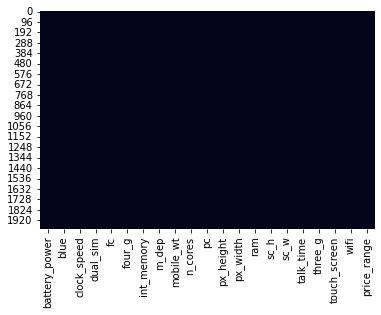

In [10]:
# Visualizing the missing values by plotting heatmap.
sns.heatmap(df.isna(), cbar=False)

### What did you know about your dataset?

The dataset given is a dataset of mobile price range prediction, and we have to analysis the price ranges and the insights behind it.A new product that has to be launched, must have the correct price so that consumers find it appropriate to buy the product.

The above dataset has 2000 rows and 21 columns. There are no mising values and duplicate values in the dataset. 

## ***2. Understanding Your Variables***

In [11]:
# Dataset Columns
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [12]:
# Dataset Describe
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000




*   We can see that sc_width and px_height has minimum value 0. which is not possible in any mobile. We need to handle this mismatch.



### Variables Description 

**Battery_power** - Total energy a battery can store in one time measured in mAh

**Blue** - Has bluetooth or not

**Clock_speed** - speed at which microprocessor executes instructions

**Dual_sim** - Has dual sim support or not

**Fc** - Front Camera mega pixels

**Four_g** - Has 4G or not

**Int_memory** - Internal Memory in Gigabytes

**M_dep** - Mobile Depth in cm

**Mobile_wt** - Weight of mobile phone

**N_cores** - Number of cores of processor

**Pc** - Primary Camera mega pixels

**Px_height** - Pixel Resolution Height

**Px_width** - Pixel Resolution Width

**Ram** - Random Access Memory in Mega

**Touch_screen** - Has touch screen or not

**Wifi** - Has wifi or not

**Sc_h** - Screen Height of mobile in cm

**Sc_w** - Screen Width of mobile in cm

**Talk_time** - longest time that a single battery charge will last 

**Three_g** - Has 3G or not

**Wifi** - Has wifi or not

**Price_range** - This is the target variable with value of 0(low cost), 1(medium cost),2(high cost) and 3(very high cost).

From above 'px_height' and 'sc_width' cannot be zero,so we should replace that.
**bold text**


### Check Unique Values for each variable.

In [13]:
# Check Unique Values for each variable.
df.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

## 3. ***Data Wrangling***

### Data Wrangling Code

In [14]:
# Write your code to make your dataset analysis ready.
df['price_range'].value_counts()


1    500
2    500
3    500
0    500
Name: price_range, dtype: int64

In [15]:
# Getting Unique mega_pixels in front_cameras .
l1=['fc','pc','n_cores']
for i in l1:
 print(f'numbers of unique values in: {i}') 
 print(df[i].unique())

 
# Getting Unique  Count
 print(f"unique {i} Count is ",df[i].nunique(),".")
 print(" ")


numbers of unique values in: fc
[ 1  0  2 13  3  4  5  7 11 12 16  6 15  8  9 10 18 17 14 19]
unique fc Count is  20 .
 
numbers of unique values in: pc
[ 2  6  9 14  7 10  0 15  1 18 17 11 16  4 20 13  3 19  8  5 12]
unique pc Count is  21 .
 
numbers of unique values in: n_cores
[2 3 5 6 1 8 4 7]
unique n_cores Count is  8 .
 


In [16]:
# Write your code to make your dataset analysis ready.
# Getting Unique values  and their counts. .

a=['blue','four_g','dual_sim','three_g','touch_screen','wifi','price_range']
for i in a:
  print(f'Num of unique values in  "{i}" and their counts')
  print(df[i].value_counts(),'\n') 

Num of unique values in  "blue" and their counts
0    1010
1     990
Name: blue, dtype: int64 

Num of unique values in  "four_g" and their counts
1    1043
0     957
Name: four_g, dtype: int64 

Num of unique values in  "dual_sim" and their counts
1    1019
0     981
Name: dual_sim, dtype: int64 

Num of unique values in  "three_g" and their counts
1    1523
0     477
Name: three_g, dtype: int64 

Num of unique values in  "touch_screen" and their counts
1    1006
0     994
Name: touch_screen, dtype: int64 

Num of unique values in  "wifi" and their counts
1    1014
0     986
Name: wifi, dtype: int64 

Num of unique values in  "price_range" and their counts
1    500
2    500
3    500
0    500
Name: price_range, dtype: int64 



In [17]:
#price_range vs talktime, battery power.
df.groupby('price_range')['talk_time','battery_power'].mean()


,talk_time,battery_power
price_range,,
0,10.612,1116.902
1,11.362,1228.868
2,10.972,1228.320
3,11.098,1379.984


In [18]:
#price_range vs fc ,pc.
df.groupby('price_range')['fc','pc'].mean()


,fc,pc
price_range,,
0,4.084,9.574
1,4.340,9.924
2,4.498,10.018
3,4.316,10.150


In [19]:
#price_range vs ram.
df.groupby('price_range')['ram'].mean()

price_range
0     785.314
1    1679.490
2    2582.816
3    3449.232
Name: ram, dtype: float64

In [20]:
#px_height,sc_w cannot be zero,so finding the no of rows with zero values
print('no of rows with zero values: ',len(df[df['px_height']==0]))
print('no of rows with zero values: ',len(df[df['sc_w']==0]))


no of rows with zero values:  2
no of rows with zero values:  180


In [21]:
#replacing thoso rowa with the mean values.
row=(df['px_height']==0)
df.loc[row,'px_height']=df['px_height'].mean()
row1=(df['sc_w']==0)
df.loc[row1,'sc_w']=df['sc_w'].mean()
df.nunique()    

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

In [22]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.753108,1251.515500,2124.213000,12.306500,6.28603,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.310973,432.199447,1084.732044,4.213245,3.96408,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,1.000000,500.000000,256.000000,5.000000,1.00000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,284.000000,874.750000,1207.500000,9.000000,3.00000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,568.000000,1247.000000,2146.500000,12.000000,5.76700,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.00000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.00000,20.000000,1.000000,1.000000,1.000000,3.000000


### What all manipulations have you done and insights you found?

We filtered the data and after filtering the data, we found that some columns have 0 values which are wrong values inserted in the data. Then we replaced it with a mean column.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

### Chart - 1  (univariate analysis) Dist plot for all columns.

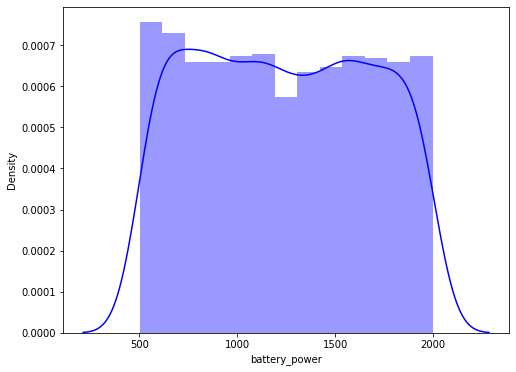

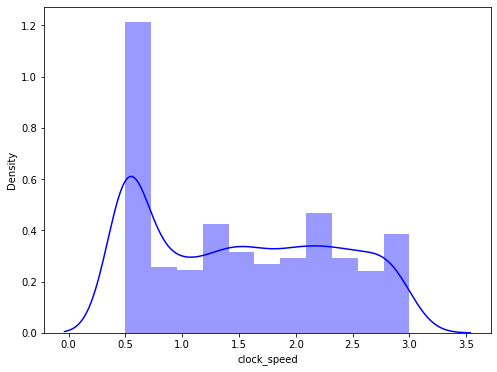

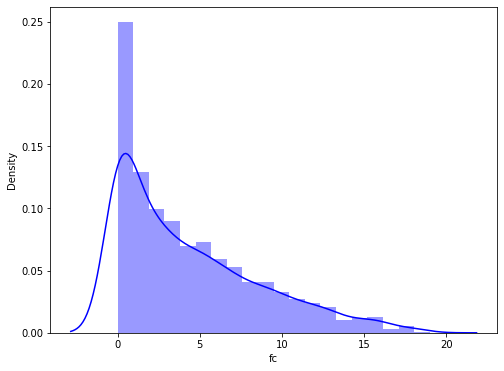

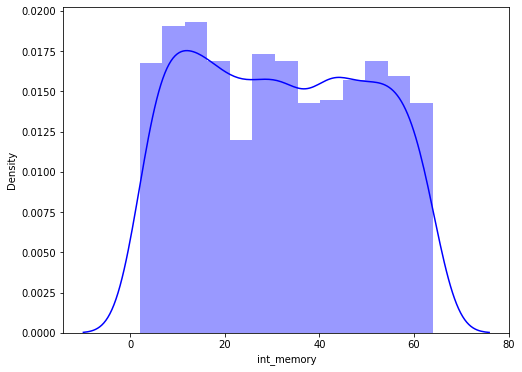

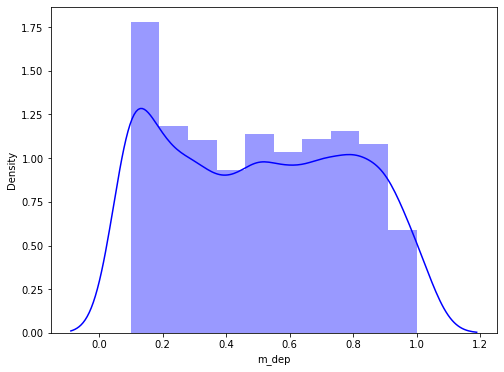

...

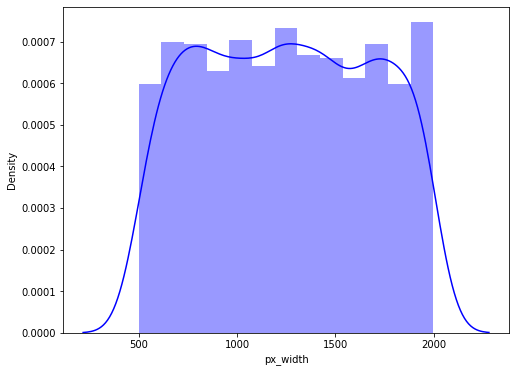

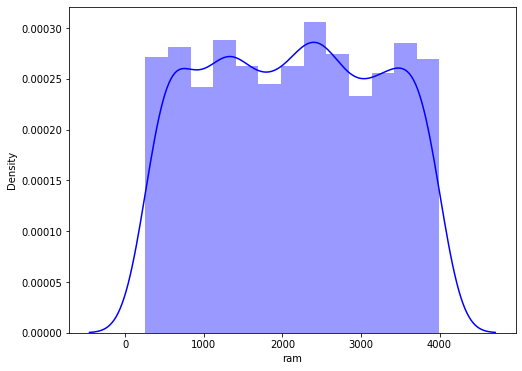

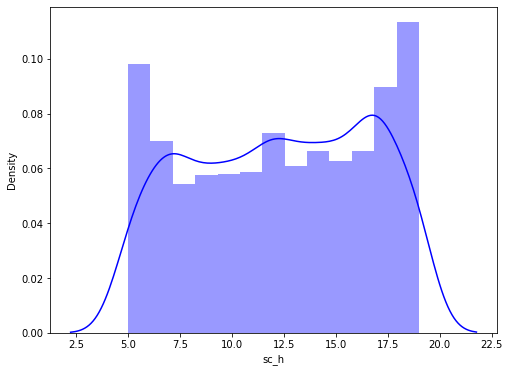

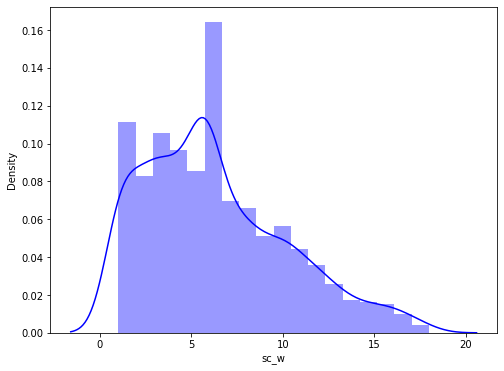

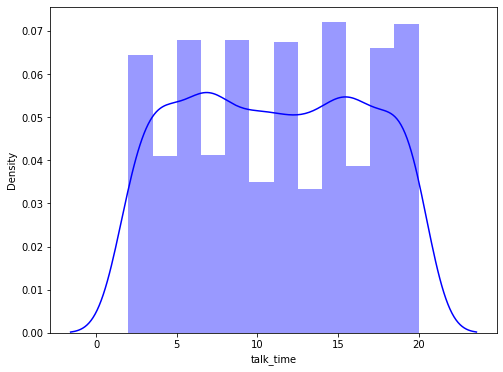

In [23]:
# Chart - 1 visualization code   
#visiualizing using distplot.   
for col in  ['battery_power', 'clock_speed',  'fc', 
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']:
  plt.figure(figsize=(8,6))
  sns.distplot(x=df[col],color='blue')
  plt.xlabel(col)
  plt.show()
  print('\n')


##### 1. Why did you pick the specific chart?

We use a  distribution plot to represent data in histogram form. It is a univariant set of collected data, which means the data distribution of one variable will be shown against another variable.


##### 2. What is/are the insight(s) found from the chart?

Data is well distributed.

fc and px_height has some outliers.

Many features have an almost uniform distribution which means there are products available almost equally in all sizes/values.

Battery power, internal_memory, Ram are almost normally distributed with respect to their set of feature values and also around 2.5gb has most count in ram similarly others.

In second row pixel_height is slightly postively skewed, pixel_width is normally distibuted.

In third row screen_height and screen_size are normally distributed unlike screen_width which is slightly positive skewed.

we can see that internal memory sizes doesn't have many difference when it comes to distribution.













#### Chart - 2(univariate analysis) Pie plot on dependent  variable.

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64
 


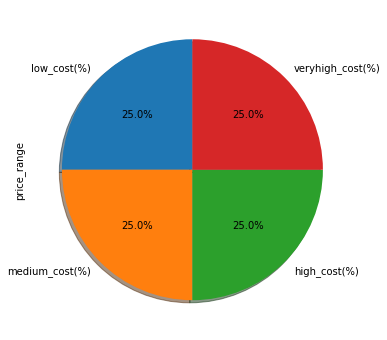

In [24]:
# Handling Imbalanced Dataset (If needed)
# Dependant Column Value Counts
print(df.price_range.value_counts())
print(" ")

# Dependant Variable Column Visualization
df.price_range.value_counts().plot(kind='pie',
                              figsize=(15,6),
                               autopct="%1.1f%%",
                               startangle=90,
                               shadow=True,
                               labels=['low_cost(%)','medium_cost(%)','high_cost(%)','veryhigh_cost(%)'],)
                               

### count plot on Blue column.

0    1010
1     990
Name: blue, dtype: int64


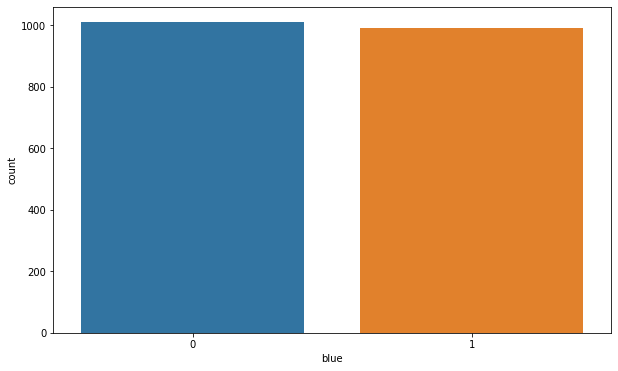

In [25]:
#Anlysis of data by vizualisation
print(df.blue.value_counts())
plt.figure(figsize = (10, 6))

sns.countplot(df['blue'])

### count plot on front camera feature.

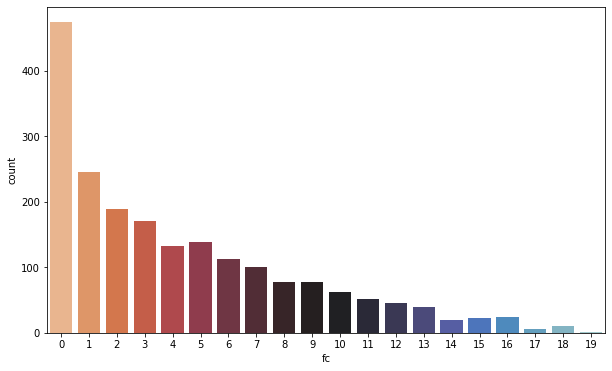

In [26]:
plt.figure(figsize=(10,6))
sns.countplot(x=df['fc'],palette='icefire_r')


### count plot on Blue feature with all price range.

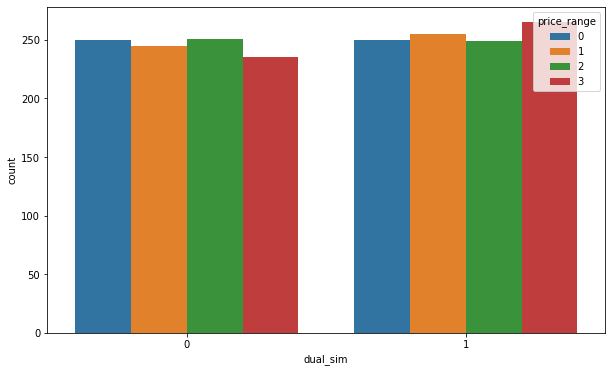

In [27]:
plt.figure(figsize = (10, 6))

sns.countplot(df['dual_sim'], hue = df['price_range'])



##### 1. Why did you pick the specific chart?

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through area covered in a circle with different colors. Where different percentage comparison comes into action pie chart is used frequently. So, I used Pie chart and which helped me to get the percentage comparision of the price_range.

The bar graph is used to compare the items between different groups over time. Bar graphs are used to measure the changes over a period of time. When the changes are larger, a bar graph is the best option to represent the data.
Thus, I have used the bar plot to show the evening, night and day manipulated data to depict meaningful insights.

countplot is used to Show the counts of observations in each categorical bin using bars

##### 2. What is/are the insight(s) found from the chart?

There are 500 phones in each price_range.

half the devices have Bluetooth, and half don’t.

half of the phone here have a dual simcard slot the other half doesn't.

majority of phone in this dataset have a front facing camera
almost a quarter of the phone in this dataset doesn't have front facing camera 




### Chart - 3-(univariate_analysis)  count plot on primary camera feature.

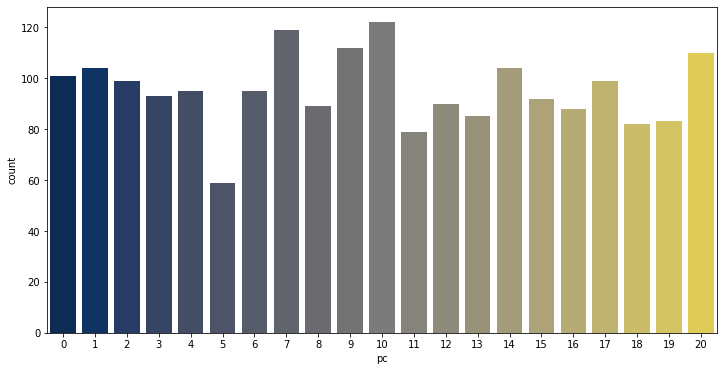

In [28]:
# Chart - 3 visualization code
plt.figure(figsize=(12,6))
sns.countplot(x=df['pc'],palette='cividis')

### count plot on No of cores feature.

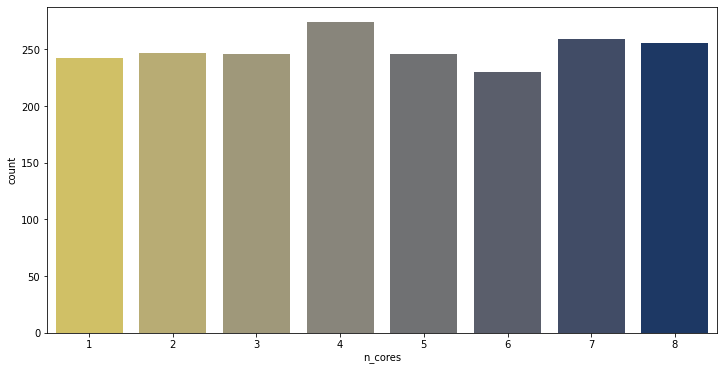

In [29]:
# Chart - 3 visualization code
plt.figure(figsize=(12,6)) 
sns.countplot(x=df['n_cores'],palette='cividis_r')

### count plot on four_g feature with different price range.

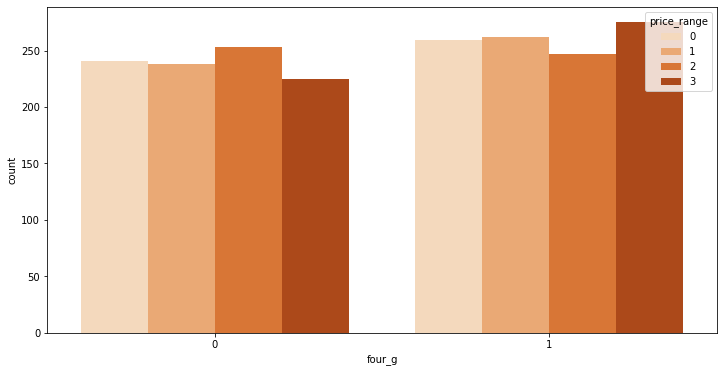

In [30]:
plt.figure(figsize = (12, 6))
sns.countplot(df['four_g'], palette='Oranges', hue = df['price_range'])


### count plot on three_g feature with different price range.

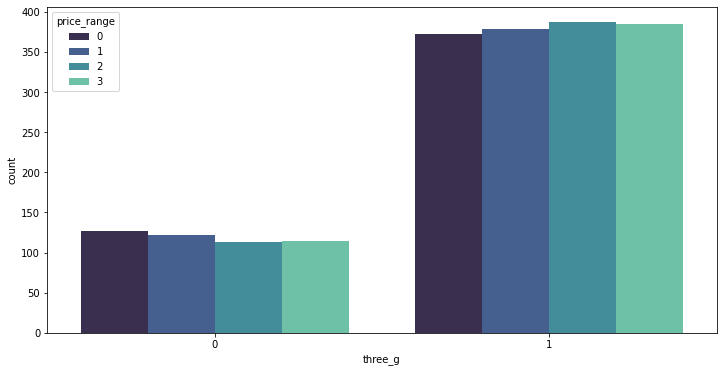

In [31]:

plt.figure(figsize = (12, 6))
sns.countplot(df['three_g'], palette = 'mako', hue = df['price_range'])

##### 1. Why did you pick the specific chart?

countplot is used to Show the counts of observations in each categorical bin using bars.


##### 2. What is/are the insight(s) found from the chart?


There are slightly more phone with 4g line compared to non 4g line. 

Phone with price range 3 has the most 4gline  among all group.

95% phone in this dataset has a primary camera (back camera)
only 5 % of phones in this dataset doens't have camera.

Most of the phones in this dataset is a multicore processor (more than 1 core processing).

Three quarter of the phones in this data set has a 3G line, 
while quarter of it doesn't even have 3G


### Chart - 4 (bivariate_analysis) price range vs ram.

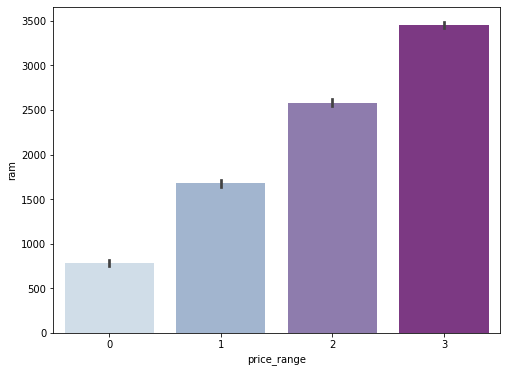

In [32]:
# Chart - 4 visualization code
# Chart - 8 visualization code
plt.figure(figsize = ( 8,6))

sns.barplot(df['price_range'], df['ram'],  palette = 'BuPu')


### Bluetooth vs price range.

0    1010
1     990
Name: blue, dtype: int64


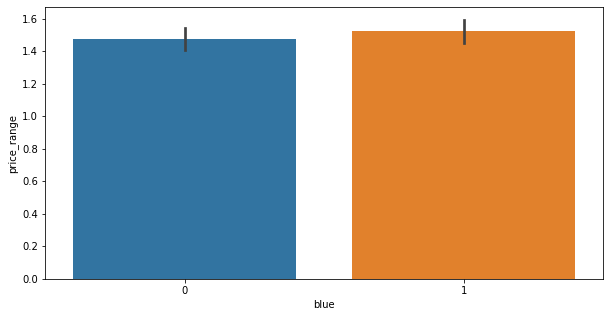

In [33]:
#anlysis of data by vizualisation
print(df.blue.value_counts())

fig,ax=plt.subplots(figsize=(10,5))
sns.barplot(data=df,x='blue',y='price_range',ax=ax)

### clockspeed vs price range.

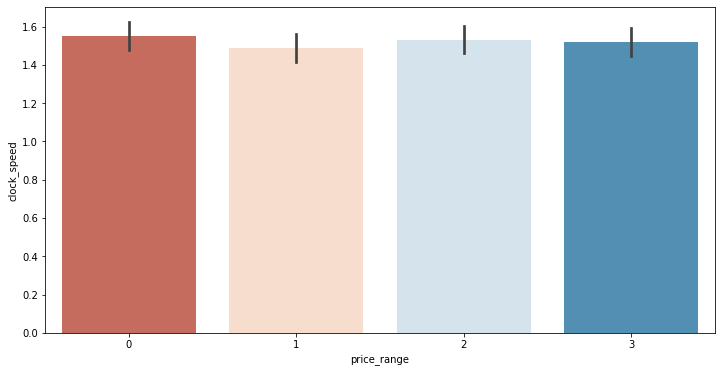

In [34]:
# clockspeed and price Range

plt.figure(figsize = (12, 6))

sns.barplot(df['price_range'], df['clock_speed'], palette = 'RdBu')



##### 1. Why did you pick the specific chart?

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable. Sometimes, bar charts show other statistics, such as percentages.

##### 2. What is/are the insight(s) found from the chart?


As from our analysis before that ramsize is highly correlated with the price range. the more expensive the price range the higher the ram a phone have
Ram has continuous increase with price range while moving from Low cost to Very high cost 

Half the devices have Bluetooth, and half don’t.

Single core processor has a faster avg clock speed compared to multicore processor in all price range.






### Chart - 5 (univariate analysis) Box plot on all features.

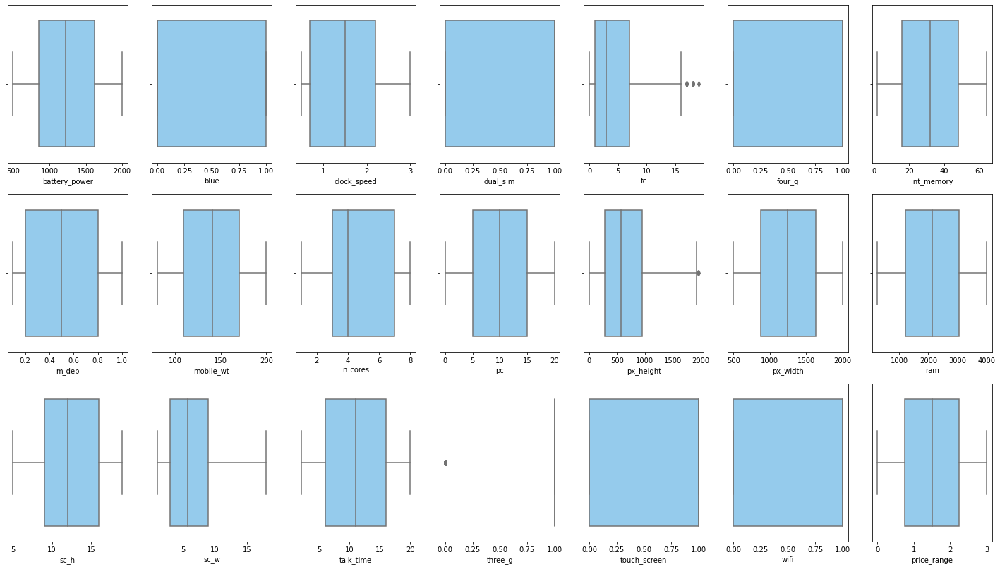

In [35]:
# Chart - 5 visualization code
# looking for outliers using box plot

plt.figure(figsize=(25,14))
for index,col in enumerate( df.columns ):
  plt.subplot(3,7,index+1)
  sns.boxplot(df[col],color='lightskyblue')
print("\n")

  
     

##### 1. Why did you pick the specific chart?

Box plots are used to show distributions of numeric data values, especially when you want to compare them between multiple groups. They are built to provide high-level information at a glance, offering general information about a group of data's symmetry, skew, variance, and outliers.

Thus, for each numerical varibale in the given dataset, I used box plot to analyse the outliers and interquartile range including mean, median, maximum and minimum value.

##### 2. What is/are the insight(s) found from the chart?

Almost all columns are symmetric distributed and mean is nearly same with median for numerical columns.
Only few columns has outliers.

### Chart - 6  (Bivariate analysis) Boxplot on price range vs px_height and px_width.

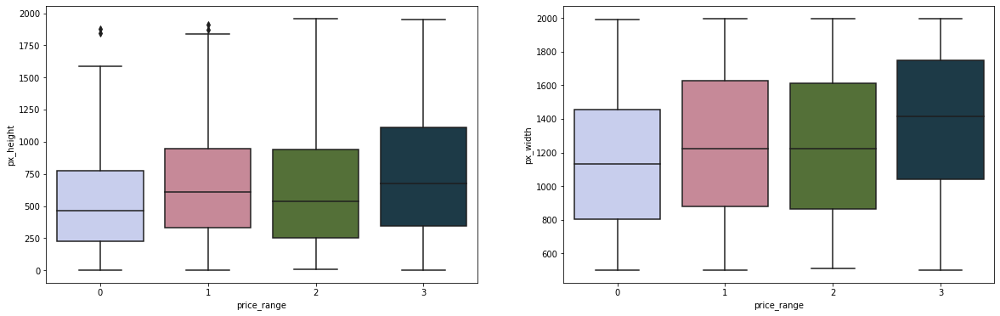

In [36]:
# Chart - 6 visualization code

fig,axs=plt.subplots(1,2 ,figsize=(20,6))

sns.boxplot(data=df, x='price_range', y='px_height', ax=axs[0],palette='cubehelix_r')

sns.boxplot(data=df, x='price_range', y='px_width', ax=axs[1],palette='cubehelix_r')

plt.show()
     



### Box plot on price range vs mobile weight.

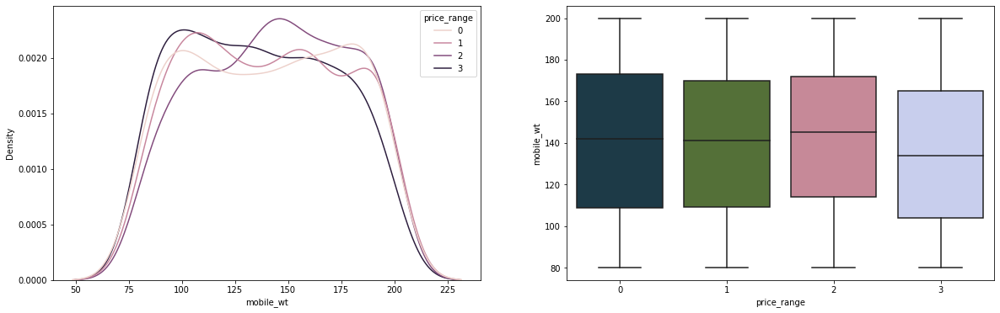

In [37]:
fig, axs = plt.subplots(1,2, figsize=(20,6))
sns.kdeplot(data=df, x='mobile_wt', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='mobile_wt', ax=axs[1],palette='cubehelix')
plt.show()

##### 1. Why did you pick the specific chart?

Box plots are used  to compare them between multiple groups. They are built to provide high-level information at a glance, offering general information about a group of data's symmetry, skew, variance, and outliers.

Thus, for each numerical varibale in the given dataset, I used box plot to analyse the outliers and interquartile range including mean, median, maximum and minimum value.

##### 2. What is/are the insight(s) found from the chart?

There is not a continuous increase in pixel height as we move from Low cost to Very high cost. Mobiles with 'Medium cost' and 'High cost' has almost equal pixel width. so we can say that it would be a driving factor in deciding price_range.

Pixel height is almost similar as we move from Low cost to Very high cost.little variation in pixel_height.

costly phones are light weight.






### Chart - 8-(multivariate analysis)

### Bluetooth vs ram with different price range.

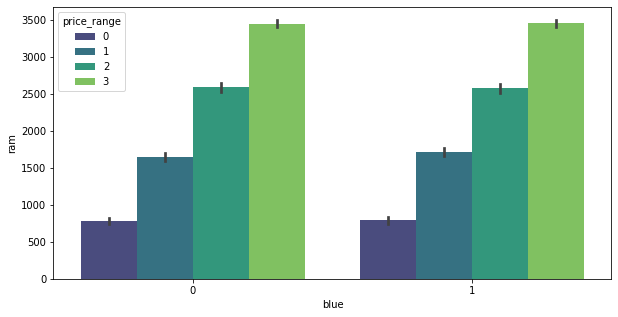

In [38]:
plt.figure(figsize = (10, 5))
sns.barplot(df['blue'], df['ram'], hue = df['price_range'], dodge=True,
             palette = 'viridis')

### Dual sim vs ram with different price range.

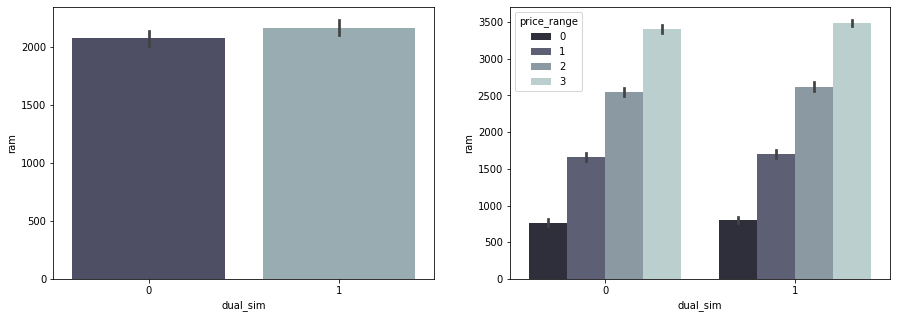

In [39]:
plt.figure(figsize = (15, 5))

plt.subplot(1,2,1)
sns.barplot(df['dual_sim'], y = df['ram'], palette = 'bone')

plt.subplot(1,2,2)
sns.barplot(df['dual_sim'], y = df['ram'], hue = df['price_range'], palette = 'bone')




##### 1. Why did you pick the specific chart?

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable. Sometimes, bar charts show other statistics, such as percentages.

##### 2. What is/are the insight(s) found from the chart?



Bluetooth seems to have no effect on ram and price range.

Phone with no bluetooth could have the same number of ram with phone that has bluetooth.

Phone with dual sim have a slightly higher ram compared to non dual sim

### Chart - 9 (Bivariate analysis) Internal memory vs Ram.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]),
 <a list of 63 Text major ticklabel objects>)

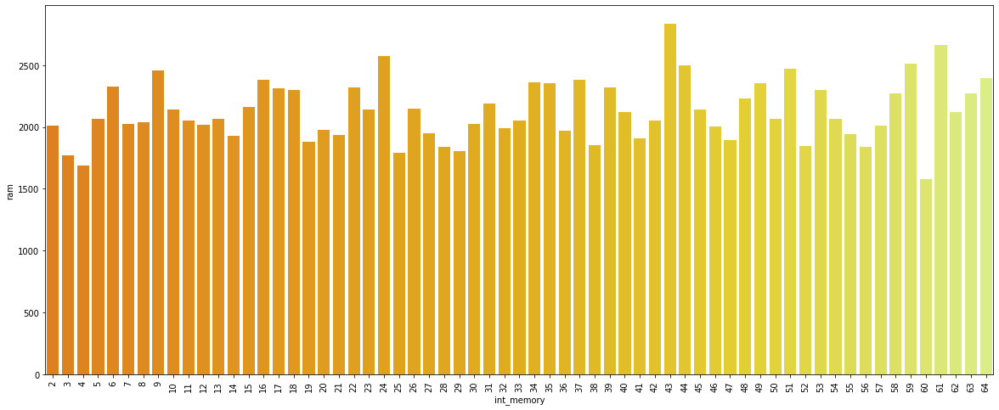

In [40]:
# Chart - 9 visualization code

plt.figure(figsize = (20, 8))


sns.barplot(df['int_memory'], y = df['ram'], palette = 'Wistia_r', ci = False)
plt.xticks(rotation = 90)


##### 1. Why did you pick the specific chart?

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable. Sometimes, bar charts show other statistics, such as percentages.

##### 2. What is/are the insight(s) found from the chart?


 The higher the memory size doesn't always means a higher ram.
 
 The highest average ram is from phone that has an internal memory of 43.



### Chart - 10 (Bivariate analysis) Line plot on price range vs internal-memory,pc and fc.

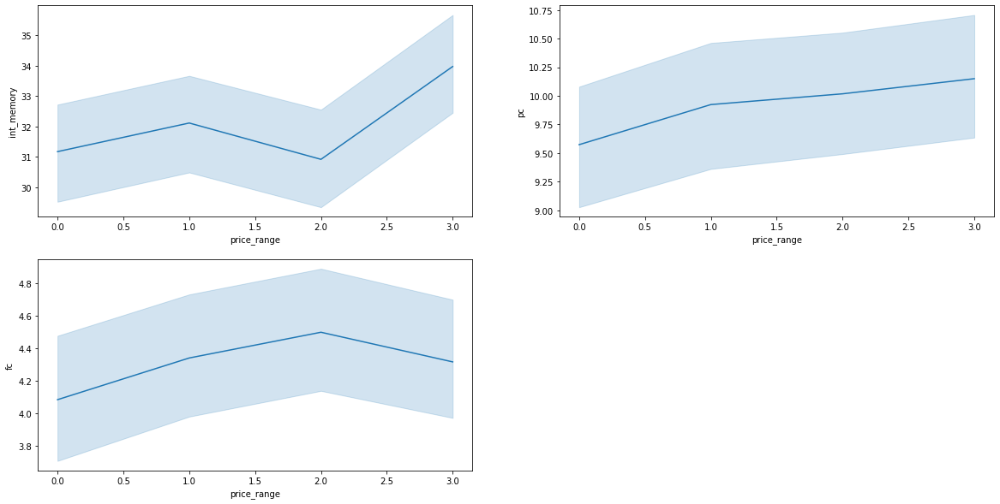

In [41]:
# Chart - 10 visualization code
plt.figure(figsize = (20, 10))
plt.subplot(2,2,1)
sns.lineplot(df['price_range'], df['int_memory'])

plt.subplot(2,2,2)
sns.lineplot(df['price_range'], df['pc'], palette = 'mako')

plt.subplot(2,2,3)
sns.lineplot(df['price_range'], df['fc'], palette = 'mako')


##### 1. Why did you pick the specific chart?

A line graph, also known as a line chart or a line plot, is commonly drawn to show information that changes over time.
A line plot is a graph that shows frequency of data along a number line. It is best to use a line plot when comparing fewer than 25 numbers. It is a quick, simple way to organize data.

##### 2. What is/are the insight(s) found from the chart?


 the average memory for all price range is kind of different 
 but looking at the trend down below 

 from price range 0 to 1 there's a slight increase in memory sizes, 
 from price range 1 to 2 there's a descrease in memory sizes. 

while for the most expensive price range we see a major sharp incline in memory sizes.

 we can see that there's a slightly increase in average primary camera megapixel when the price range increase.
 
by looking at this graph the price range increase as the front camera increase 

however the the average front camera megapixel drop when the price range goes from 2 to 3  


### Chart - 11 - Correlation Heatmap

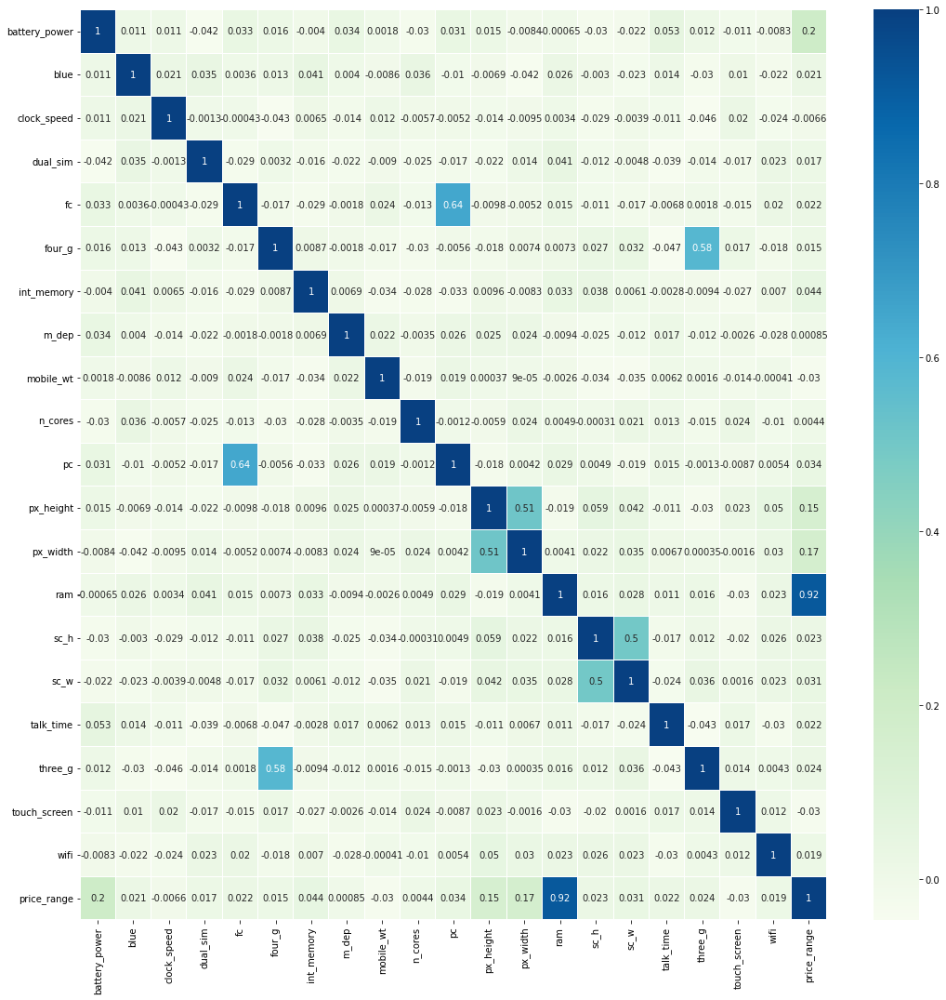

In [42]:
# Correlation Heatmap visualization code
plt.figure(figsize=(18,18)) #plot heat map
g=sns.heatmap(df.corr(),annot=True,cmap="GnBu",linecolor='white',linewidths=0.01)

##### 1. Why did you pick the specific chart?

A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses. The range of correlation is [-1,1].

Thus to know the correlation between all the variables along with the correlation coeficients, i used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

 From the graph RAM and price_range is highly correlated, it signifies that RAM will play major deciding factor in estimating the price range.

There is some collinearity in feature pairs ('pc', 'fc') and ('px_width', 'px_height'). Both correlations are justified since there are good chances that if front camera of a phone is good, the back camera would also be good.

Also, if px_height increases, pixel width also increases, that means the overall pixels in the screen. We can replace these two features with one feature. Front Camera megapixels and Primary camera megapixels are different entities despite of showing colinearity. So we'll be keeping them as they are.

### Chart - 12 - Pair Plot 

<Figure size 1440x1440 with 0 Axes>

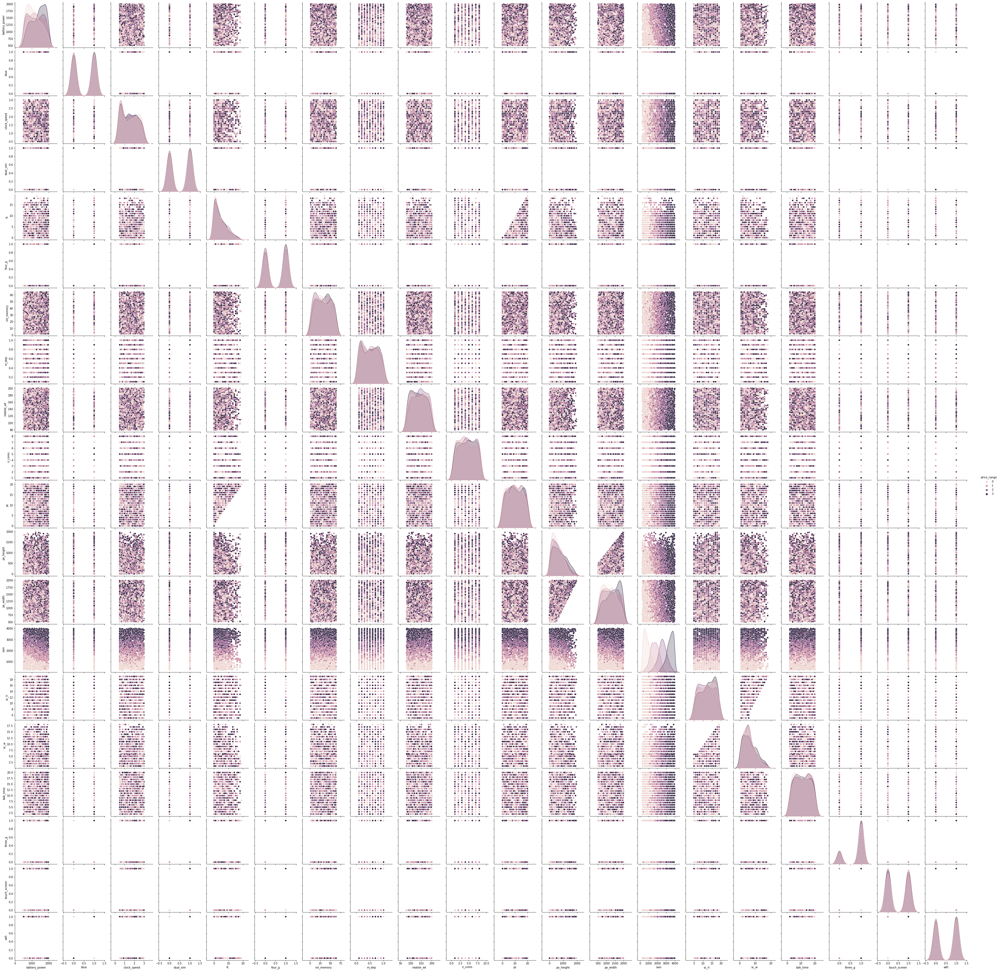

In [44]:
#pair plot visualization code.
plt.figure(figsize=(20,20))
sns.pairplot(df,hue='price_range')

##### 1. Why did you pick the specific chart?

pair plot to analyse the patterns of data and realationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

There are less linear relationship between variables and data points aren't linearly separable.


## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

1. Mobiles in the mid-price range have an average of at least 2000 MB of RAM.
2. Mobiles in the higher price range have an average maximum battery power of 1000 mAh.
3. Mobiles in the very high price range have an average primary camera of 10 mega pixels.

In [45]:
# Creating Parameter Class 
class findz:
  def proportion(self,sample,hyp,size):
    return (sample - hyp)/math.sqrt(hyp*(1-hyp)/size)
  def mean(self,hyp,sample,size,std):
    return (sample - hyp)*math.sqrt(size)/std
  def varience(self,hyp,sample,size):
    return (size-1)*sample/hyp

variance = lambda x : sum([(i - np.mean(x))**2 for i in x])/(len(x)-1)
zcdf = lambda x: norm(0,1).cdf(x)
# Creating a function for getting P value
def p_value(z,tailed,t,hypothesis_number,df,col):
  if t!="true":
    z=zcdf(z)
    if tailed=='l':
      return z
    elif tailed == 'r':
      return 1-z
    elif tailed == 'd':
      if z>0.5:
        return 2*(1-z)
      else:
        return 2*z
    else:
      return np.nan
  else:
    z,p_value=stats.ttest_1samp(df[col],hypothesis_number)
    return p_value
    
  


# Conclusion about the P - Value
def conclusion(p):
  significance_level = 0.05
  if p>significance_level:
    return f"Failed to reject the Null Hypothesis for p = {p}."
  else:
    return f"Null Hypothesis rejected Successfully for p = {p}"

# Initializing the class
findz = findz()

### Hypothetical Statement - 1

Mobiles in the mid-price range have an average of at least 2000 MB of RAM.


#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 2000

Alternate Hypothesis : N < 2000

Test Type: Left Tailed Test

#### 2. Perform an appropriate statistical test.

In [46]:
# Perform Statistical Test to obtain P-Value
# Perform Statistical Test to obtain P-Value
hypo_1=df[(df["price_range"]==1)]
# Getting the required parameter values for hypothesis testing
hypothesis_number = 2000
sample_mean = hypo_1["ram"].mean()
size = len(hypo_1)
std=(variance(hypo_1["ram"]))**0.5

In [47]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)
# Getting P - Value
p = p_value(z=z,tailed='l',t='true',hypothesis_number=hypothesis_number,df=hypo_1,col="ram")
# Getting Conclusion
print(conclusion(p))

Null Hypothesis rejected Successfully for p = 5.424897065462854e-44


##### Which statistical test have you done to obtain P-Value?

I have used T-test as a statistical test to get the p-value and found that the null hypothesis is rejected and on average high price range mobiles have less than 2000 MB of RAM.

##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' price_range skew : 0.007')

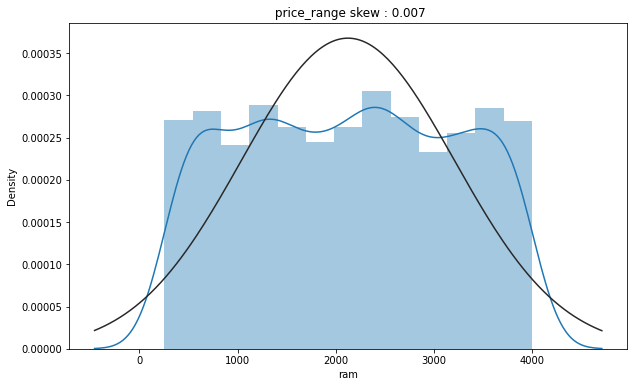

In [48]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))

skew = df['ram'].skew()
sns.distplot(df['ram'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%(col, skew))

In [49]:
mean_median_difference=hypo_1["ram"].median()- hypo_1["ram"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- 7.009999999999991



From the above chart we can see median is less than mean over 7. So, the distribution is postively skewed. For a skewed data Z-Test can't be performed.

Non-parametric tests are most useful for small studies. Using non-parametric tests in large studies may provide answers to the wrong question, thus confusing readers. For studies with a large sample size, t-tests and their corresponding confidence intervals can and should be used even for heavily skewed data.

So, for a skewed data we can use T-test for better result. Thus, I used t - test.

### Hypothetical Statement - 2

Mobiles in the higher price range have an average maximum battery power of 1000 mAh.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 1000

Alternate Hypothesis : N > 1000

Test Type: Right Tailed Test

#### 2. Perform an appropriate statistical test.

In [50]:
# Perform Statistical Test to obtain P-Value
# Perform Statistical Test to obtain P-Value
hypo_2 = df[(df["price_range"]==2)]
# Getting the required parameter values for hypothesis testing
hypothesis_number = 1000
sample_mean = hypo_2["battery_power"].mean()
size = len(hypo_2)
std=(variance(hypo_2["battery_power"]))**0.5

In [51]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)
# Getting P - Value
p = p_value(z=z,tailed='r',t='true',hypothesis_number=hypothesis_number,df=hypo_2,col="battery_power")
# Getting Conclusion
print(conclusion(p))

Null Hypothesis rejected Successfully for p = 2.0424813917644103e-26


##### Which statistical test have you done to obtain P-Value?

I have used T-test as a statistical test to get the p-value and found that the null hypothesis is rejected and the average maximum battery of mobiles in high price range is more than 1000 mAh

##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' battery_power skew : 0.032')

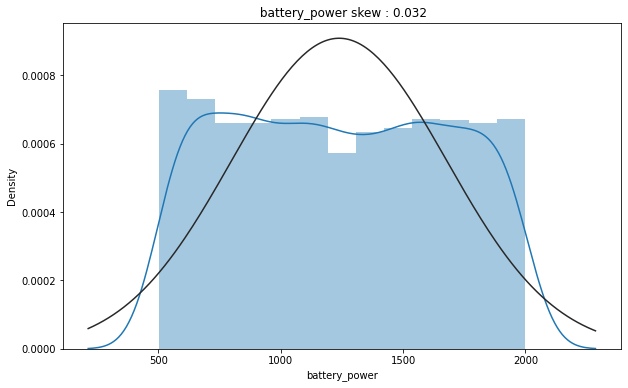

In [52]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))

skew = df['battery_power'].skew()
sns.distplot(df['battery_power'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%('battery_power', skew))

In [53]:
mean_median_difference=hypo_2["battery_power"].median()- hypo_2["battery_power"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- -8.819999999999936


From the above chart we can see median is less than mean over 8. So, the distribution is postively skewed. For a skewed data Z-Test can't be performed.

Non-parametric tests are most useful for small studies. Using non-parametric tests in large studies may provide answers to the wrong question, thus confusing readers. For studies with a large sample size, t-tests and their corresponding confidence intervals can and should be used even for heavily skewed data.

So, for a skewed data we can use T-test for better result. Thus, I used t - test.

### Hypothetical Statement - 3

Mobiles in the very high price range have an average primary camera of 10 mega pixels.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 10

Alternate Hypothesis : N != 10

Test Type: Two Tailed Test

#### 2. Perform an appropriate statistical test.

In [54]:
# Perform Statistical Test to obtain P-Value
# Perform Statistical Test to obtain P-Value
hypo_3=df[(df["price_range"]== 3)]
# Getting the required parameter values for hypothesis testing
hypothesis_number_3 = 10
sample_mean_3 = hypo_3["pc"].mean()
size_3 = len(hypo_1)
std_3=(variance(hypo_3["pc"]))**0.5

In [55]:
# Getting Z value
z = findz.mean(hypothesis_number_3,sample_mean_3,size_3,std_3)
# Getting P - Value
p = p_value(z=z,tailed='d',t='false',hypothesis_number=hypothesis_number_3,df=hypo_3,col="pc")
# Getting Conclusion
print(conclusion(p))

Failed to reject the Null Hypothesis for p = 0.5815233046743389.


##### Which statistical test have you done to obtain P-Value?

I have used the Z-test as a statistical test to get the p-value and found that the null hypothesis fails to be rejected and Mobiles in the very high price range have an average primary camera of 10 mega pixels.

##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' primary camera skew : 0.017')

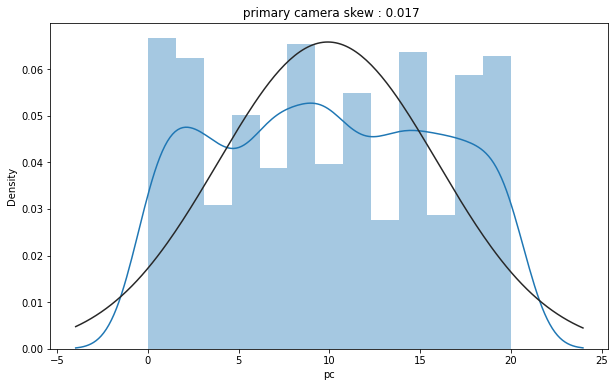

In [56]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))

skew = df['pc'].skew()
sns.distplot(df['pc'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%('primary camera', skew))

In [57]:
mean_median_difference=hypo_3["pc"].median()- hypo_2["pc"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- -0.018000000000000682


As shown above the Mean median difference is around 0.01 and nearly zero. Mean is approximately same as the median. Thus, it is a Normal Distribution. That's why I have used Z-Test directly

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


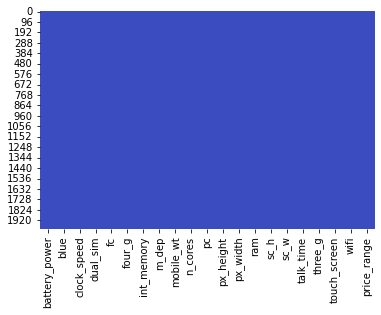

In [58]:
# Handling Missing Values & Missing Value Imputation
print(df.isnull().sum())


# Visualizing the missing values
# Checking Null Value by plotting Heatmap
sns.heatmap(df.isnull(), cbar=False, cmap='coolwarm')


#### What all missing value imputation techniques have you used and why did you use those techniques?

Given dataset has no missing values.

### 2. Handling Outliers

##### What all outlier treatment techniques have you used and why did you use those techniques?

In [59]:
# Encode your categorical columns
df.dtypes.value_counts()


int64      17
float64     4
dtype: int64

In [60]:
from operator import is_not
#categorical_columns
cat_columns= ['blue',  'dual_sim',  'four_g', 'three_g','touch_screen', 'wifi']
print('categorical columns are:',cat_columns)

#numerical_columns
num_columns   =  []
for x in df.columns.tolist():
  if x  in cat_columns:
    pass
  else:
    num_columns.append(x)
print('numerical columns are :',num_columns)    


categorical columns are: ['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi']
numerical columns are : ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'price_range']


In [61]:
def outlires(dataCol):     
      
    sorted(dataCol)                          # sort column
    Q1,Q3 = np.percentile(dataCol,[25,75])   # getting 25% and 75% percentile
    IQR = Q3-Q1                              # getting IQR 
    LowerRange = Q1-(1.5 * IQR)              # getting Lowrange
    UpperRange = Q3+(1.5 * IQR)              # getting Upperrange 
    
    colname = dataCol.tolist()               # convert column into list  
    newlist =[]                              # empty list for store new values
    for i in range(len(colname)):
        
        if colname[i] > UpperRange:          # list number > Upperrange 
            colname[i] = UpperRange          # then number = Upperrange
            newlist.append(colname[i])       # append value to empty list
        elif colname[i] < LowerRange:        # list number < Lowrange 
            colname[i] = LowerRange          # then number = Lowrange
            newlist.append(colname[i])       # append value to empty list 
        else:
            colname[i]                       # list number
            newlist.append(colname[i])       # append value to empty list
            
        

    return newlist

In [62]:
for i in range(len(num_columns)):
    new_list =  outlires(df.loc[:,num_columns[i]]) # retrun new list
    df.loc[:,num_columns[i]] = new_list    

In [63]:
data_final_num = df[['battery_power',  'clock_speed' , 'fc','int_memory','m_dep', 'mobile_wt','n_cores', 'pc',
                      'px_height','px_width','ram', 'sc_h', 'sc_w', 'talk_time']]

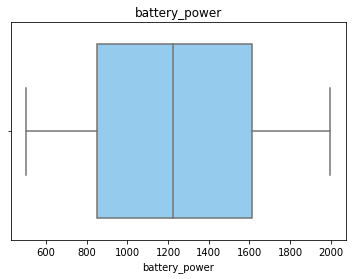

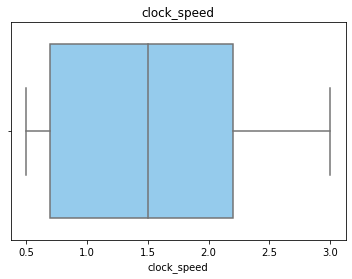

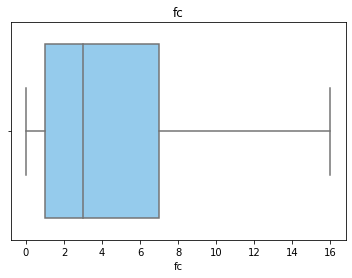

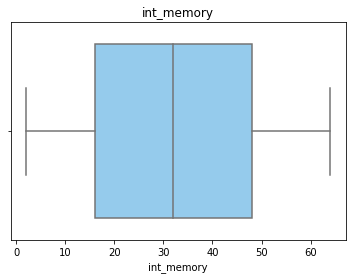

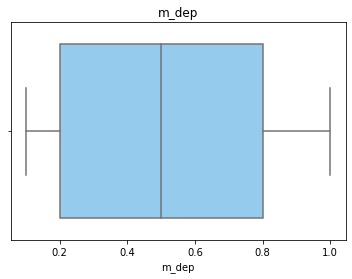

...

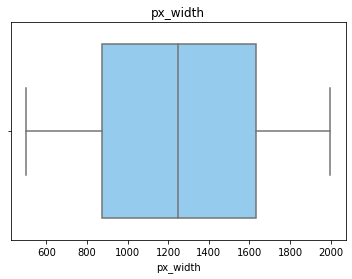

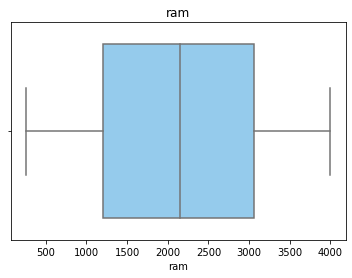

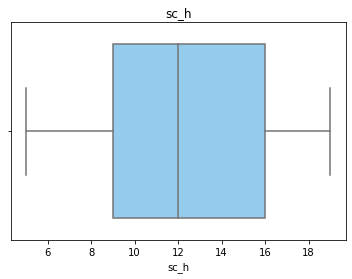

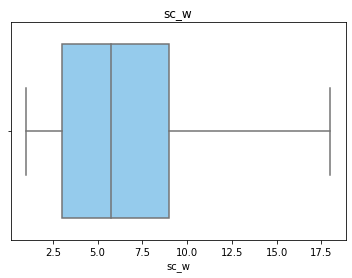

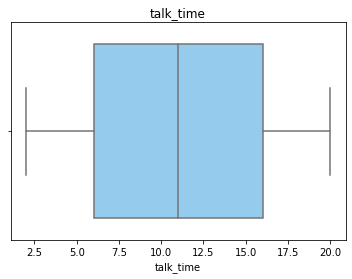

In [64]:

for i in data_final_num.columns:
    sns.boxplot(data_final_num[i],color='lightskyblue')
    plt.title(i)
    plt.show()

we have successfully removed outliers from our dataset.

### 3. Categorical Encoding

#### What all categorical encoding techniques have you used & why did you use those techniques?

Dataset does not require categorical encoding.

### 4. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction

In [65]:
# Expand Contraction

#### 2. Lower Casing

In [66]:
# Lower Casing

#### 3. Removing Punctuations

In [67]:
# Remove Punctuations

#### 4. Removing URLs & Removing words and digits contain digits.

In [68]:
# Remove URLs & Remove words and digits contain digits

#### 5. Removing Stopwords & Removing White spaces

In [69]:
# Remove Stopwords

In [70]:
# Remove White spaces

#### 6. Rephrase Text

In [71]:
# Rephrase Text

#### 7. Tokenization

In [72]:
# Tokenization

#### 8. Text Normalization

In [73]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)

##### Which text normalization technique have you used and why?

Answer Here.

#### 9. Part of speech tagging

In [74]:
# POS Taging

#### 10. Text Vectorization

In [75]:
# Vectorizing Text

##### Which text vectorization technique have you used and why?

Answer Here.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In this section we will try to modify some columns and form new columns. Earlier we saw px_height and px_width were moderately correlated. Also they are dimensions, and we know area is the quantity that expresses the extent of a two-dimensional region. Therefore we will convert 2 columns into single one.

Also we saw sc_h and sc_w were moderately correlated. These are dimentions too. Thus, we will convert these 2 columns into a single one.

Having done this modification will help to reduce the dimensionality of the dataset to an extent and thus model can perform better with reduced computational time.

In [76]:
# Manipulate Features to minimize feature correlation and create new features
#creating 'sc_size'column from sc_h and sc_w.  
df['screen_size']= round(np.sqrt(df['sc_h']**2+df['sc_w']**2)/2.54,2)

#creating 'px_size' column from px_height and px_weight.
df['Pixels']=df['px_height']*df['px_width']

#dropping columns.
df.drop(['sc_h','sc_w','px_height','px_width'],axis=1,inplace=True)
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,ram,talk_time,three_g,touch_screen,wifi,price_range,screen_size,Pixels
0,842,0,2.2,0,1.0,0,7,0.6,188,2,2,2549,19,0,0,1,1,4.49,15120.0
1,1021,1,0.5,1,0.0,1,53,0.7,136,3,6,2631,7,1,1,0,2,6.80,1799140.0
2,563,1,0.5,1,2.0,1,41,0.9,145,5,6,2603,9,1,1,0,2,4.40,2167308.0
3,615,1,2.5,0,0.0,0,10,0.8,131,6,9,2769,11,1,0,0,2,7.04,2171776.0
4,1821,1,1.2,0,13.0,1,44,0.6,141,2,14,1411,15,1,1,0,1,3.25,1464096.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0.0,1,2,0.8,106,6,14,668,19,1,1,0,0,5.35,2309580.0
1996,1965,1,2.6,1,0.0,0,39,0.2,187,4,3,2032,16,1,1,1,2,5.85,1797975.0
1997,1911,0,0.9,1,1.0,1,36,0.7,108,8,3,3057,5,1,1,0,3,3.57,1416576.0
1998,1512,0,0.9,0,4.0,1,46,0.1,145,5,5,869,19,1,1,1,0,8.11,225120.0


#### 2. Feature Selection

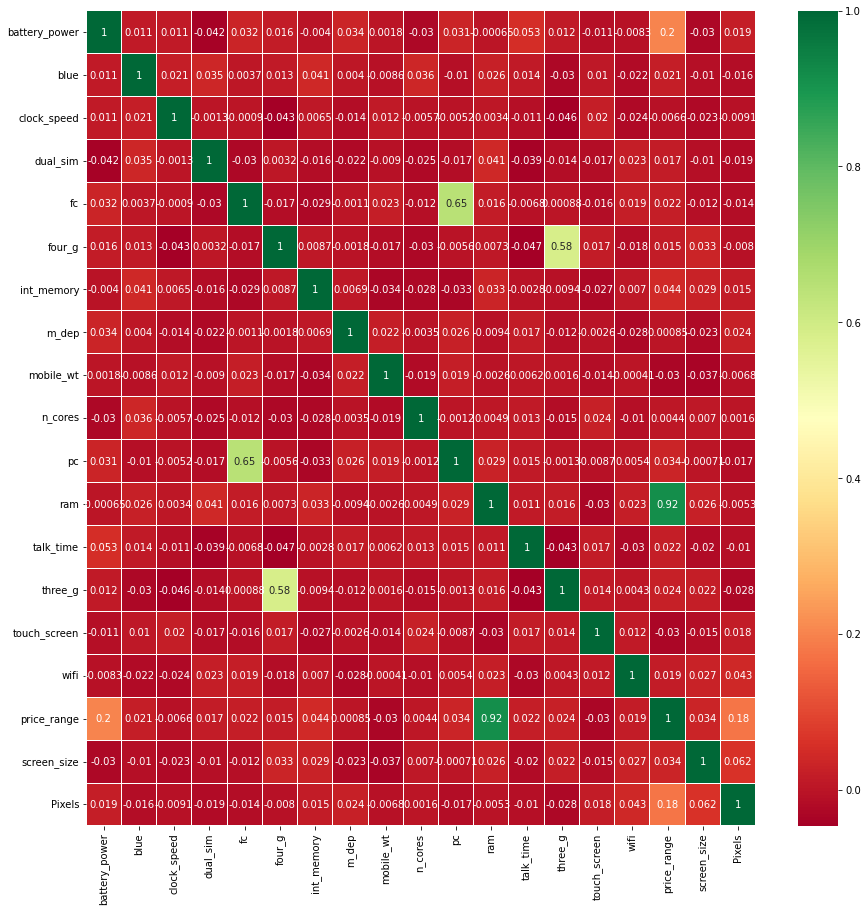

In [77]:
# Select your features wisely to avoid overfitting
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True,cmap="RdYlGn",linecolor='white',linewidths=0.01)

##### What all feature selection methods have you used  and why?

Answer Here.

##### Which all features you found important and why?

Answer Here.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [78]:
# Defining X and y

X = df.drop(['price_range'], axis = 1)
y = df['price_range']

In [79]:
X.shape

(2000, 18)

In [80]:
y.shape

(2000,)

### 6. Data Scaling

In [81]:
# Scaling your data
# Scaling values of X

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

##### Which method have you used to scale you data and why?

MinMax Scaler:
There is another way of data scaling, where the minimum of feature is made equal to zero and the maximum of feature equal to one. MinMax Scaler shrinks the data within the given range, usually of 0 to 1. It transforms data by scaling features to a given range. It scales the values to a specific value range without changing the shape of the original distribution.


### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

In [82]:
# DImensionality Reduction (If needed)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Answer Here.

### 8. Data Splitting

In [83]:
# Split your data to train and test. Choose Splitting ratio wisely
#separate the dataset in two type one training is 80% of data and other testing is 20% of data.

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.20, random_state = 42)

In [84]:
X_train.shape


(1600, 18)

In [85]:
y_train.shape


(1600,)

##### What data splitting ratio have you used and why? 

There are two competing concerns: with less training data, your parameter estimates have greater variance. With less testing data, your performance statistic will have greater variance. Broadly speaking you should be concerned with dividing data such that neither variance is too high, which is more to do with the absolute number of instances in each category rather than the percentage.

If you have a total of 100 instances, you're probably stuck with cross validation as no single split is going to give you satisfactory variance in your estimates. If you have 100,000 instances, it doesn't really matter whether you choose an 80:20 split or a 90:10 split (indeed you may choose to use less training data if your method is particularly computationally intensive).

You'd be surprised to find out that 80/20 is quite a commonly occurring ratio, often referred to as the Pareto principle. It's usually a safe bet if you use that ratio.

In this case the training dataset is small, that's why I have taken 80:20 ratio.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64
 


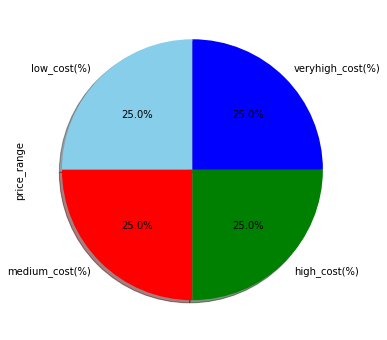

In [86]:
# Handling Imbalanced Dataset (If needed)
# Chart - 1 visualization code
# Dependant Column Value Counts
print(df.price_range.value_counts())
print(" ")

# Dependant Variable Column Visualization
df.price_range.value_counts().plot(kind='pie',
                              figsize=(15,6),
                               autopct="%1.1f%%",
                               startangle=90,
                               shadow=True,
                               labels=['low_cost(%)','medium_cost(%)','high_cost(%)','veryhigh_cost(%)'],
                               colors=['skyblue','red','green','blue'])

Our dataset is  perfectly balanced.

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

## ML Model - 1(**Logistic** **Regression**)


In [87]:
# ML Model - 1 Implementation
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

# Fit the Algorithm
lr.fit(X_train, y_train)

LogisticRegression()

In [88]:
# Predict on the model
y_pred_test = lr.predict(X_test)
y_pred_train = lr.predict(X_train)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [89]:
# Visualizing evaluation Metric Score chart
lr.intercept_

array([  8.31663995,   3.75117372,  -1.28946508, -10.77834859])

In [90]:
from sklearn import metrics
train_accur1=metrics.accuracy_score(y_pred_train, y_train)
print('accuracy_of_train_dataset:',train_accur1)

test_accur1=metrics.accuracy_score(y_pred_test, y_test)
print('accuracy_of_test_dataset:',test_accur1)

accuracy_of_train_dataset: 0.91875
accuracy_of_test_dataset: 0.895


In [91]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for  train 
cf1=confusion_matrix(y_pred_train,y_train)
print('confusion_matrix:')
print(cf1)
print('\n ')
print('classification_report:')
print(classification_report(y_pred_train,y_train))


# Visualizing evaluation Metric Score chart.
# Get the confusion matrix for  test.
cf2=confusion_matrix(y_pred_test,y_test)
print('confusion_matrix:')
print(cf2)
print('\n ')
print('classification_report:')
print(classification_report(y_pred_test,y_test))

confusion_matrix:
[[383  20   0   0]
 [ 12 365  33   0]
 [  0  24 349  15]
 [  0   0  26 373]]

 
classification_report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       403
           1       0.89      0.89      0.89       410
           2       0.86      0.90      0.88       388
           3       0.96      0.93      0.95       399

    accuracy                           0.92      1600
   macro avg       0.92      0.92      0.92      1600
weighted avg       0.92      0.92      0.92      1600

confusion_matrix:
[[102   5   0   0]
 [  3  78   9   0]
 [  0   8  75   9]
 [  0   0   8 103]]

 
classification_report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       107
           1       0.86      0.87      0.86        90
           2       0.82      0.82      0.82        92
           3       0.92      0.93      0.92       111

    accuracy                           0.90       4

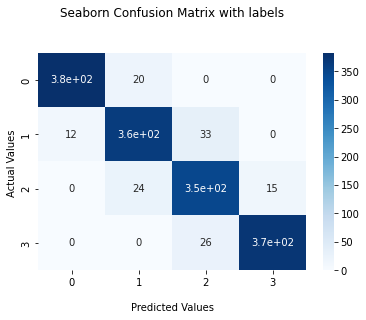

In [92]:
# visualization of confusion matrix.
ax = sns.heatmap(cf1, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()

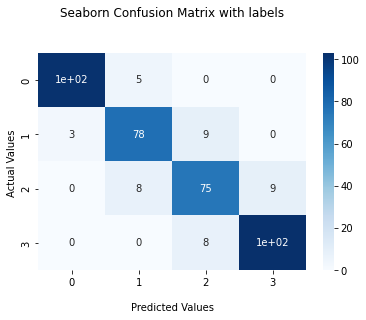

In [93]:
# visualization of confusion matrix.
ax = sns.heatmap(cf2, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()

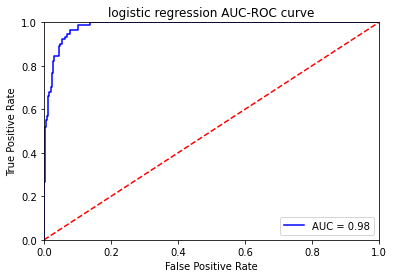

In [94]:

#plotting AUC ROC curve 
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
probs = lr.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds,pos_label=1)
roc_auc = metrics.auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('logistic regression AUC-ROC curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

I used Logistic regression algorithm to create the model. 

**For testing dataset**


precision of 95% and recall of 93% and f1-score of 94% for low cost mobile.

precision of 85% and recall of 87% and f1-score of 86% for medium cost mobile.

precision of 85% and recall of 84% and f1-score of 84% for  high cost mobile.  

precision of 93% and recall of 94% and f1-score of 93% for very high cost mobile.

Accuracy is 90% and average percision, recall & f1_score are 89%, 89% and 89% respectively .

**For training dataset**

precision of 100% and recall of 100% and f1-score of 100% for low cost mobile. 

precision of 100% and recall of 100% and f1-score of 100% for medium cost mobile. 

precision of 100% and recall of 100% and f1-score of 100% for  high cost mobile.  

precision of 100% and recall of 100% and f1-score of 100% for very high cost mobile.

Accuracy is 100% and average percision, recall & f1_score are 100%, 100% and 100% respectively .

Next tryting to improving the score by using hyperparameter tuning technique.

#### 2. Cross- Validation & Hyperparameter Tuning

In [95]:
#ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
from sklearn.model_selection import RepeatedStratifiedKFold
lr_model = LogisticRegression(random_state=0)

param_grid = { 'penalty': ['l1','none' 'elasticnet','l2'], 'C': [0.01,1,30,50,150],'solver':['lbfgs','newton-cg'] }


grid = GridSearchCV(estimator=lr_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy',cv = 3, verbose = 2)
grid_result=grid.fit(X_train, y_train)


Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END .......C=0.01, penalty=noneelasticnet, solver=lbfgs; total time=   0.0s
[CV] END .......C=0.01, penalty=noneelasticnet, solver=lbfgs; total time=   0.0s
[CV] END .......C=0.01, penalty=noneelasticnet, solver=lbfgs; total time=   0.0s
[CV] END ...C=0.01, penalty=noneelasticnet, solver=newton-cg; total time=   0.0s
[CV] END ...C=0.01, penalty=noneelasticnet, solver=newton-cg; total time=   0.0s
[CV] END ...C=0.01, penalty=noneelasticnet, solv

In [96]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


Best: 0.923124 using {'C': 150, 'penalty': 'l2', 'solver': 'newton-cg'}


In [97]:
lr=LogisticRegression(penalty= 'l2',  C=150, fit_intercept=True, intercept_scaling=1, class_weight=None, random_state=None, solver='newton-cg', max_iter=150, multi_class='auto', verbose=0, warm_start=False, n_jobs=-1, l1_ratio=None)

In [98]:
# Predict on the model
lr1=lr.fit(X_train,y_train)
# Get the predicted classes
train_class_preds = lr1.predict(X_train)
test_class_preds = lr1.predict(X_test)


In [99]:
tune_train_accur1=metrics.accuracy_score(train_class_preds, y_train)
print('accuracy_of_train_dataset:',tune_train_accur1)

tune_test_accur1=metrics.accuracy_score(test_class_preds, y_test)
print('accuracy_of_test_dataset:',tune_test_accur1)

accuracy_of_train_dataset: 0.950625
accuracy_of_test_dataset: 0.9275


In [100]:
cf=confusion_matrix(train_class_preds,y_train)
print('confusion_matrix:')
print(cf)
print('classification_report_of_train:''\n\n',classification_report( y_train,train_class_preds))
print(" ")

cf2=confusion_matrix(test_class_preds,y_test)
print('confusion_matrix:')
print(cf2)
print('classification_report_of_test:''\n\n',classification_report( y_test,test_class_preds))
print(" ")

confusion_matrix:
[[389   9   0   0]
 [  6 384  19   0]
 [  0  16 375  15]
 [  0   0  14 373]]
classification_report_of_train:

               precision    recall  f1-score   support

           0       0.98      0.98      0.98       395
           1       0.94      0.94      0.94       409
           2       0.92      0.92      0.92       408
           3       0.96      0.96      0.96       388

    accuracy                           0.95      1600
   macro avg       0.95      0.95      0.95      1600
weighted avg       0.95      0.95      0.95      1600

 
confusion_matrix:
[[101   3   0   0]
 [  4  84   4   0]
 [  0   4  83   9]
 [  0   0   5 103]]
classification_report_of_test:

               precision    recall  f1-score   support

           0       0.97      0.96      0.97       105
           1       0.91      0.92      0.92        91
           2       0.86      0.90      0.88        92
           3       0.95      0.92      0.94       112

    accuracy                      

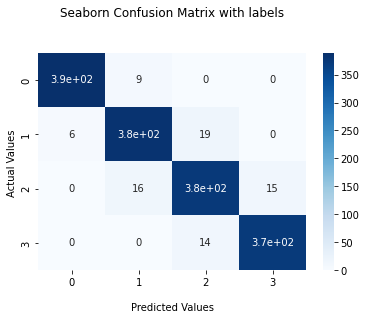

In [101]:
# visualization of confusion matrix.
ax = sns.heatmap(cf, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()

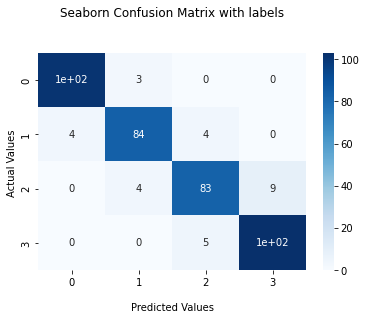

In [102]:
# visualization of confusion matrix.
ax = sns.heatmap(cf2, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model.  But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. 
Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model. 

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.



**For training dataset**

 

precision of 98% and recall of 98% and f1-score of 98% for low cost mobile.

precision of 94% and recall of 94% and f1-score of 94% for medium cost mobile.
 
precision of 92% and recall of 92% and f1-score of 92% for  high cost mobile.  

precision of 96% and recall of 96% and f1-score of 96% for very high cost mobile.

Accuracy is 95% and average percision, recall & f1_score are 95%, 95% and 95% respectively.


**For testing dataset**

precision of 97% and recall of 96% and f1-score of 97% for low cost mobile.

precision of 91% and recall of 92% and f1-score of 92% for medium cost mobile. 

precision of 86% and recall of 90% and f1-score of 88% for  high cost mobile.  

precision of 95% and recall of 92% and f1-score of 94% for very high cost mobile.

Accuracy is 93% and average percision, recall & f1_score are 93%, 93% and 93% respectively .

Train accuarcy has been reduced to 100% from 95% and test accuarcy is increased by 3% . Thus we somewhat reduced the overfiiting by reducing the training accuarcy. However this will be good model for us.

## ML Model - 2(**Random forest classifier**)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [103]:
# Visualizing evaluation Metric Score chart
from sklearn.ensemble import RandomForestClassifier
Rc=RandomForestClassifier()

#Fit the model.
Rc.fit(X_train,y_train)


RandomForestClassifier()

In [104]:
#prediction.
y_pred_test1=Rc.predict(X_test)
y_pred_train1=Rc.predict(X_train)

In [105]:
# Calculating accuracy on train and test
from sklearn import metrics
train_accur2=metrics.accuracy_score(y_pred_train1,y_train)
print('accuracy_score_of_train_data:',train_accur2)
test_accur2=metrics.accuracy_score(y_pred_test1,y_test)
print('accuracy_score_of_test_data:',test_accur2)

accuracy_score_of_train_data: 1.0
accuracy_score_of_test_data: 0.865


In [106]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for both train and test
cf1=confusion_matrix(y_pred_train1,y_train)
print('confusion_matrix:')
print(cf1)
print('\n ')
print('classification_report:')
print(classification_report(y_train,y_pred_train1))

cf2=confusion_matrix(y_pred_test1,y_test)
print('confusion_matrix:')
print(cf2)
print('\n ')
print('classification_report:')
print(classification_report(y_pred_test1,y_test))

confusion_matrix:
[[395   0   0   0]
 [  0 409   0   0]
 [  0   0 408   0]
 [  0   0   0 388]]

 
classification_report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       395
           1       1.00      1.00      1.00       409
           2       1.00      1.00      1.00       408
           3       1.00      1.00      1.00       388

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600

confusion_matrix:
[[100   8   0   0]
 [  5  73   8   0]
 [  0  10  76  15]
 [  0   0   8  97]]

 
classification_report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       108
           1       0.80      0.85      0.82        86
           2       0.83      0.75      0.79       101
           3       0.87      0.92      0.89       105

    accuracy                           0.86       4

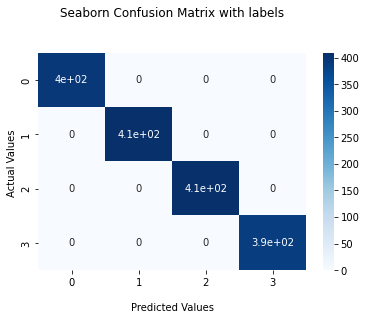

In [107]:
ax = sns.heatmap(cf1, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()

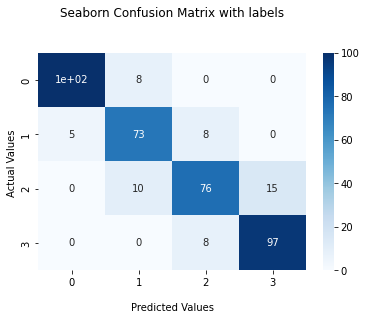

In [108]:
ax = sns.heatmap(cf2, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()

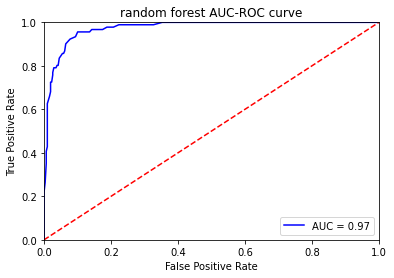

In [109]:

#plotting AUC ROC curve 
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
probs = Rc.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds,pos_label=1)
roc_auc = metrics.auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('random forest AUC-ROC curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [110]:

feature_importance = pd.DataFrame({'Feature':X.columns,
                                   'Score':Rc.feature_importances_}).sort_values(by='Score', ascending=False).reset_index(drop=True)
feature_importance.head()

,Feature,Score
0,ram,0.504106
1,battery_power,0.078900
2,Pixels,0.076486
3,screen_size,0.043101
4,mobile_wt,0.042874


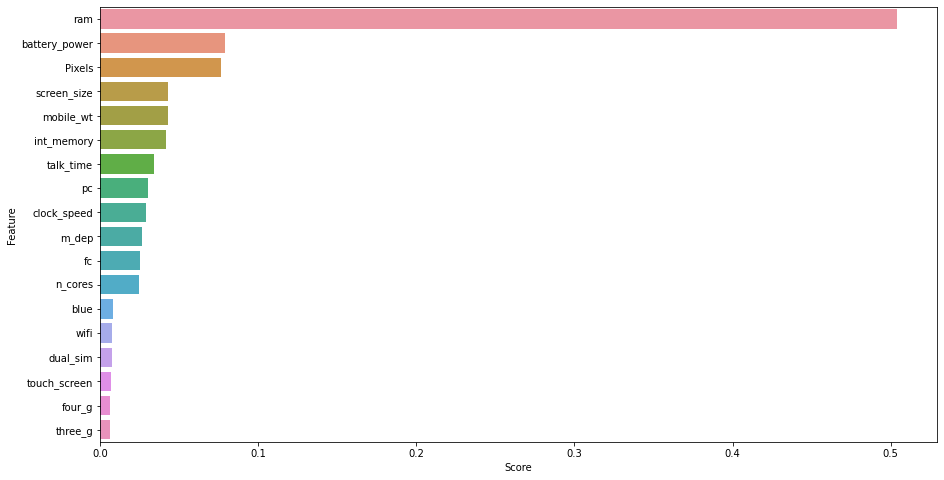

In [111]:

plt.figure(figsize=(15,8))
sns.barplot(x=feature_importance['Score'], y=feature_importance['Feature'])
plt.show()


*Train accuarcy is 100% and test accuracy is 88%. which is quite good. But model seems to be overfitted and has not generalised the data well. We need to reduce overfitting and improve the model performance.*
*we do some hyperparameter tunning to reduce overfitting*

#### 2. Cross- Validation & Hyperparameter Tuning

In [112]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
from sklearn.model_selection import GridSearchCV
'''params={'n_estimators':[90,200,300,500], 'max_depth':[7, 9, 11, 13,30,50], 
        
                 'min_samples_split' : [2, 5, 10],
                 'min_samples_leaf': [1, 2, 5, 10]}

 #Fit the Algorithm

rf = RandomForestClassifier()
Rc = GridSearchCV(rf, params, scoring='accuracy', cv=3)
Rc.fit(X_train,y_train)'''

 #Predict on the model

"params={'n_estimators':[90,200,300,500], 'max_depth':[7, 9, 11, 13,30,50], \n        \n                 'min_samples_split' : [2, 5, 10],\n                 'min_samples_leaf': [1, 2, 5, 10]}\n\n #Fit the Algorithm\n\nrf = RandomForestClassifier()\nRc = GridSearchCV(rf, params, scoring='accuracy', cv=3)\nRc.fit(X_train,y_train)"

In [113]:
#Rc.best_params_

In [114]:
Rc=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='entropy', max_depth=13, max_features='auto',
                       max_leaf_nodes=200,
                       min_impurity_decrease=0.0,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=0,
                       verbose=0, warm_start=False)
Rc.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=13, max_leaf_nodes=200, n_estimators=500,
                       random_state=0)

In [115]:
#accuracy_score of train and test data.
y_pred_train=Rc.predict(X_train)
tune_train_accur2=accuracy_score(y_pred_train,y_train)
print('accuracy_score_of_train_data:',tune_train_accur2)

y_pred_test = Rc.predict(X_test)
tune_test_accur2=accuracy_score(y_pred_test,y_test)
print('accuracy_score_of_test_data:',tune_test_accur2)

accuracy_score_of_train_data: 1.0
accuracy_score_of_test_data: 0.8975


#### 1. Explain the ML Model used and it's performance using Evaluation metric 


In [116]:
#confusion matrix for train and test dataset.

cf4=confusion_matrix(y_pred_train,y_train)
print('confusion_matrix:')
print(cf4)
print('\n ')
print('classification_report:')
print(classification_report(y_pred_train,y_train))

cf3=confusion_matrix(y_pred_test,y_test)
print('confusion_matrix:')
print(cf3)
print('\n ')
print('classification_report:')
print(classification_report(y_pred_test,y_test))



confusion_matrix:
[[395   0   0   0]
 [  0 409   0   0]
 [  0   0 408   0]
 [  0   0   0 388]]

 
classification_report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       395
           1       1.00      1.00      1.00       409
           2       1.00      1.00      1.00       408
           3       1.00      1.00      1.00       388

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600

confusion_matrix:
[[100   7   0   0]
 [  5  77   7   0]
 [  0   7  78   8]
 [  0   0   7 104]]

 
classification_report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       107
           1       0.85      0.87      0.86        89
           2       0.85      0.84      0.84        93
           3       0.93      0.94      0.93       111

    accuracy                           0.90       4

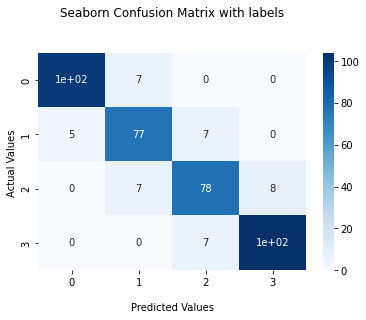

In [117]:
#visualize using heatmap.
ax = sns.heatmap(cf3, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

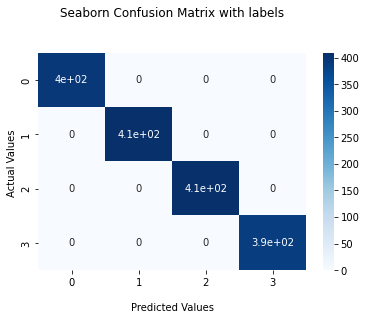

In [118]:
#visualize using heatmap.
ax = sns.heatmap(cf4, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

In [119]:
feature_importance=pd.DataFrame({'features':X.columns,'score':Rc.feature_importances_}).sort_values(by='score',ascending=False).reset_index(drop=True)
feature_importance.head(6)

,features,score
0,ram,0.574930
1,battery_power,0.080309
2,Pixels,0.073177
3,mobile_wt,0.035632
4,screen_size,0.034153
5,int_memory,0.033145


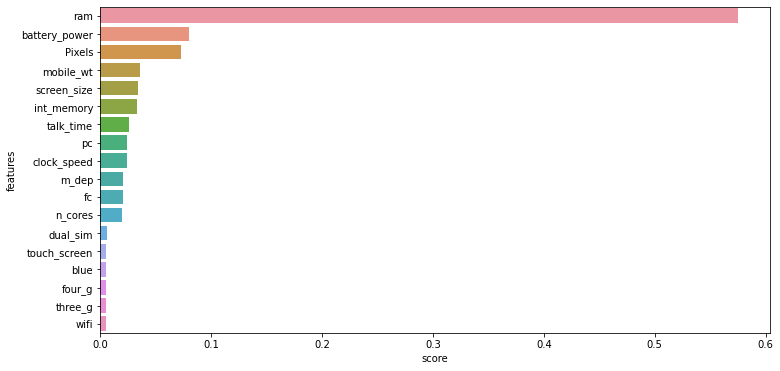

In [120]:
plt.figure(figsize=(12,6))
sns.barplot(x=feature_importance['score'],y=feature_importance['features'])
plt.show()


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model.  But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. 
Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model. 

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

**For training dataset**

precision of 100% and recall of 100% and f1-score of 100% for low cost mobile.

precision of 100% and recall of 100% and f1-score of 100% for medium cost mobile. 

precision of 100% and recall of 100% and f1-score of 100% for  high cost mobile.
  
precision of 100% and recall of 100% and f1-score of 100% for very high cost mobile.

Accuracy is 100% and average percision, recall & f1_score are 100%, 100% and 100% respectively . 


**For testing dataset**
 

precision of 95% and recall of 93% and f1-score of 94% for low cost mobile.

precision of 85% and recall of 87% and f1-score of 86% for medium cost mobile. 

precision of 85% and recall of 86% and f1-score of 85% for  high cost mobile.  

precision of 95% and recall of 94% and f1-score of 94% for very high cost mobile.

Accuracy is 90% and average percision, recall & f1_score are 90%, 90% and 90% respectively .

*After tuning:*

*Training accuarcy= 100%*
*Test accuarcy = 90%*
*we have slightly improved the model and overfitting is reduced slightly.*

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Answer Here.

###ML MODEL 4:(Decision Tree Classifier)

In [121]:
from sklearn.tree import DecisionTreeClassifier

Dtc = DecisionTreeClassifier()
Dtc.fit(X_train, y_train)


DecisionTreeClassifier()

In [122]:
# Get the predicted classes
train_preds_DT = Dtc.predict(X_train)
test_preds_DT = Dtc.predict(X_test)

In [123]:
# accuracy score
print("Model - Decision Tree")
train_accur4 = accuracy_score(train_preds_DT,y_train)
print(f"Accuracy score for train data is", train_accur4)
test_accur4 = accuracy_score(test_preds_DT,y_test)
print(f"Accuracy score for test data is", test_accur4)

Model - Decision Tree
Accuracy score for train data is 1.0
Accuracy score for test data is 0.8375


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score chart.

In [124]:
cf3=confusion_matrix(train_preds_DT,y_train)
print('confusion_matrix:')
print(cf3)
print('\n ')
print('classification_report:')
print(classification_report(train_preds_DT,y_train))

cf4=confusion_matrix(test_preds_DT,y_test)
print('confusion_matrix:')
print(cf4)
print('\n ')
print('classification_report:')
print(classification_report(test_preds_DT,y_test))

confusion_matrix:
[[395   0   0   0]
 [  0 409   0   0]
 [  0   0 408   0]
 [  0   0   0 388]]

 
classification_report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       395
           1       1.00      1.00      1.00       409
           2       1.00      1.00      1.00       408
           3       1.00      1.00      1.00       388

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600

confusion_matrix:
[[ 94   4   0   0]
 [ 11  76  18   0]
 [  0  11  64  11]
 [  0   0  10 101]]

 
classification_report:
              precision    recall  f1-score   support

           0       0.90      0.96      0.93        98
           1       0.84      0.72      0.78       105
           2       0.70      0.74      0.72        86
           3       0.90      0.91      0.91       111

    accuracy                           0.84       4

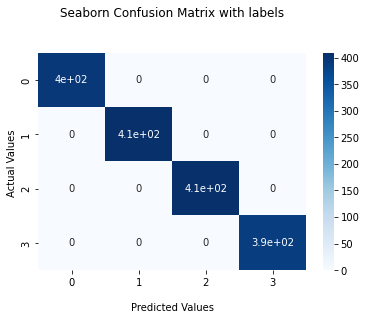

In [125]:
# visulize the confusion matrix for  test.
ax = sns.heatmap(cf3, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

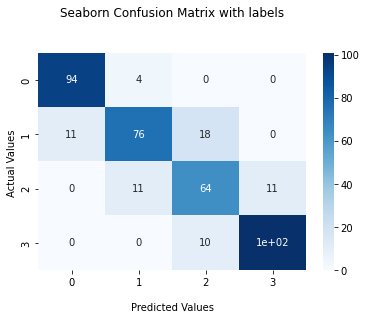

In [126]:
# visulize the confusion matrix for  test.
ax = sns.heatmap(cf4, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

*Train set accuracy is 100% and test accuracy is 84%.*
*Model is overfitted on train set and did not generalised well.*
*We will tune hyperparamters to reduce overfitting and try to imporve the model performance.*

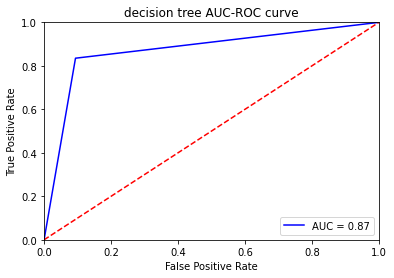

In [127]:

#plotting AUC ROC curve 
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
probs = Dtc.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds,pos_label=1)
roc_auc = metrics.auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('decision tree AUC-ROC curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

##2. Cross- Validation & Hyperparameter Tuning




In [128]:
#defining parameter for model

parameters={'criterion':['gini','entropy'],
             'max_depth':[4,5,6,9,10,20],
            "min_samples_leaf":[1,2,3,4,5,10,15,20],
             'splitter':['best'],
             'min_samples_split':[3,5,10],
            "max_leaf_nodes":[None,10,20,30,40,50],
           'max_features':['auto','sqrt','log2',None]}    

In [129]:
#building decision tree regression model with cross validation and hyper parameter tunning
from sklearn.model_selection import RandomizedSearchCV

class_dt_model = DecisionTreeClassifier()
tuning_dt = GridSearchCV(class_dt_model,param_grid= parameters,scoring='accuracy',cv=3,verbose=0)
tuning_dt.fit(X_train, y_train)
tuning_dt.best_params_


{'criterion': 'entropy',
 'max_depth': 10,
 'max_features': None,
 'max_leaf_nodes': 40,
 'min_samples_leaf': 10,
 'min_samples_split': 5,
 'splitter': 'best'}

In [130]:
Dc = DecisionTreeClassifier(criterion= 'entropy',
 max_depth= 10,
 max_features=None,
 max_leaf_nodes= None,
 min_samples_leaf= 5,
 min_samples_split= 5,
 splitter= 'best')
Dc.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=5,
                       min_samples_split=5)

In [131]:
# prediction for training and test set
y_pred = Dc.predict(X_train)
y_pred1 = Dc.predict(X_test)

tune_train_accur4=accuracy_score(y_train,y_pred)
print("Accuracy score for train data is:",tune_train_accur4)

tune_test_accur4=accuracy_score(y_test,y_pred1)
print("Accuracy score for train data is:",tune_test_accur4)


Accuracy score for train data is: 0.955
Accuracy score for train data is: 0.865


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [132]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for both train and test
from sklearn.metrics import classification_report,confusion_matrix

# Get the confusion matrix for  test.
print('confusion_matrix')
cf=confusion_matrix(y_train,y_pred)
print(cf)
print(' ')
print('classification_report')
print(classification_report(y_train,y_pred))


# Get the confusion matrix for  test.
print('confusion_matrix')
cf1=confusion_matrix(y_test,y_pred1)
print(cf1)
print(' ')
print('classification_report')
print(classification_report(y_test,y_pred1))


confusion_matrix
[[386   9   0   0]
 [ 10 387  12   0]
 [  0  14 385   9]
 [  0   0  18 370]]
 
classification_report
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       395
           1       0.94      0.95      0.95       409
           2       0.93      0.94      0.94       408
           3       0.98      0.95      0.96       388

    accuracy                           0.95      1600
   macro avg       0.96      0.96      0.96      1600
weighted avg       0.96      0.95      0.96      1600

confusion_matrix
[[ 95  10   0   0]
 [  8  76   7   0]
 [  0  10  75   7]
 [  0   0  12 100]]
 
classification_report
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       105
           1       0.79      0.84      0.81        91
           2       0.80      0.82      0.81        92
           3       0.93      0.89      0.91       112

    accuracy                           0.86       400
   

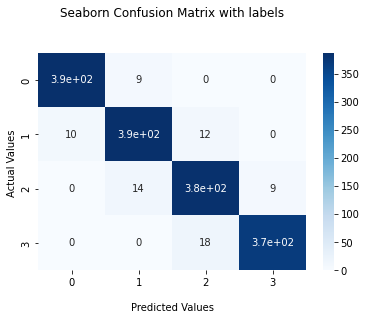

In [133]:
# visulize the confusion matrix for  test.
ax = sns.heatmap(cf, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

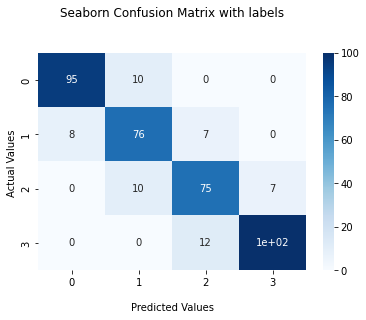

In [134]:
# visulize the confusion matrix for  test.
ax = sns.heatmap(cf1, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

In [135]:

feature_importance = pd.DataFrame({'Feature':X.columns,
                                   'Score':Dc.feature_importances_}).sort_values(by='Score', ascending=False).reset_index(drop=True)
feature_importance.head()

,Feature,Score
0,ram,0.707098
1,battery_power,0.134509
2,Pixels,0.132393
3,mobile_wt,0.010657
4,talk_time,0.004266


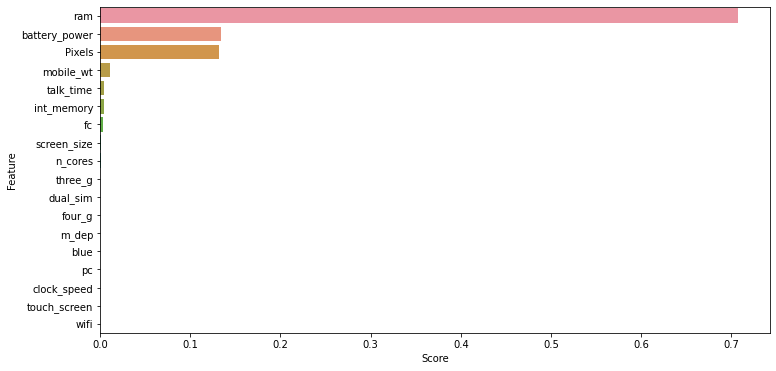

In [136]:
plt.figure(figsize=(12,6))
sns.barplot(x=feature_importance['Score'],y=feature_importance['Feature'])
plt.show()


###Which hyperparameter optimization technique have you used and why?

To find the best hyperparameters values we can try the Manual Search method by using the hit and trial process and can find the best hyperparameters which would take huge time.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.



**For training dataset**


precision of 97% and recall of 98% and f1-score of 98% for low cost mobile. 

precision of 94% and recall of 95% and f1-score of 95% for medium cost mobile. 

precision of 93% and recall of 94% and f1-score of 94% for  high cost mobile.  

precision of 98% and recall of 95% and f1-score of 96% for very high cost mobile. 

Accuracy is 95% and average percision, recall & f1_score are 96%, 96% and 96% respectively .

**For testing dataset**

precision of 92% and recall of 90% and f1-score of 91% for low cost mobile.

precision of 79% and recall of 84% and f1-score of 81% for medium cost mobile. 

precision of 80% and recall of 82% and f1-score of 81% for  high cost mobile.  

precision of 93% and recall of 89% and f1-score of 91% for very high cost mobile.

Accuracy is 86% and average percision, recall & f1_score are 86%, 86% and 86% respectively .

*Train accuarcy has been reduced to 100% from 95% and test accuarcy is increased by 3% . Thus we somewhat reduced the overfiiting by reducing the training accuarcy. However this will be good model for us.*

*Ram,battery power,px_height and width came out to be the most important featrures.*



##ML MODEL 4: (support vector machine classifier.)

In [137]:
# Applying the Support Vector Machine
from sklearn.svm import SVC
svm_clsf = SVC(probability=True)   #If you want SVM to output probabilities, you need to specify probability=True when you are instantiating the SVC class.
# fit the model
svm_clsf.fit(X_train , y_train)

SVC(probability=True)

In [138]:
#predict values
y_train_pred_svm = svm_clsf.predict(X_train)
y_test_pred_svm = svm_clsf.predict(X_test)

In [139]:
# Calculating accuracy on train and test
train_accur5 = accuracy_score(y_train , y_train_pred_svm)
test_accur5 = accuracy_score(y_test , y_test_pred_svm)

print("Accuracy score of train data : ",train_accur5)
print("Accuracy score of test data : " ,test_accur5)

Accuracy score of train data :  0.955625
Accuracy score of test data :  0.855


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score chart.

In [140]:
# confusion matrix of train data
cf3 = confusion_matrix(y_train , y_train_pred_svm)
print('confusion_matrix:')
print(cf3)
print('\n ')
# classification report of train data
print("Classification report\n\n",classification_report(y_train , y_train_pred_svm))


# confusion matrix of test data
cf4 = confusion_matrix(y_test , y_test_pred_svm)
print('confusion_matrix:')
print(cf4)
print('\n ')
# classification report of test data
print("Classification report\n\n",classification_report(y_test , y_test_pred_svm))

confusion_matrix:
[[385  10   0   0]
 [  9 388  12   0]
 [  0  13 388   7]
 [  0   0  20 368]]

 
Classification report

               precision    recall  f1-score   support

           0       0.98      0.97      0.98       395
           1       0.94      0.95      0.95       409
           2       0.92      0.95      0.94       408
           3       0.98      0.95      0.96       388

    accuracy                           0.96      1600
   macro avg       0.96      0.96      0.96      1600
weighted avg       0.96      0.96      0.96      1600

confusion_matrix:
[[98  7  0  0]
 [ 5 76 10  0]
 [ 0 12 73  7]
 [ 0  0 17 95]]

 
Classification report

               precision    recall  f1-score   support

           0       0.95      0.93      0.94       105
           1       0.80      0.84      0.82        91
           2       0.73      0.79      0.76        92
           3       0.93      0.85      0.89       112

    accuracy                           0.85       400
   macro av

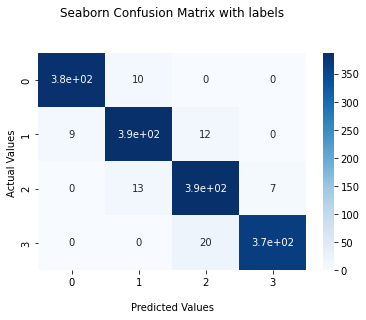

In [141]:
# visulize the confusion matrix for  test.
ax = sns.heatmap(cf3, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

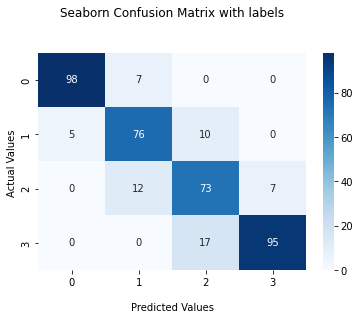

In [142]:
# visulize the confusion matrix for  test.
ax = sns.heatmap(cf4, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

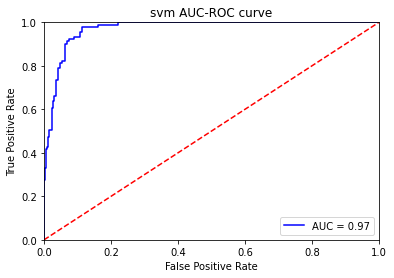

In [143]:

#plotting AUC ROC curve 
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
probs = svm_clsf.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds,pos_label=1)
roc_auc = metrics.auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('svm AUC-ROC curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

##2. Cross- Validation & Hyperparameter Tuning

In [144]:
# ML Model - 1 Implementation
svm_clsf = SVC()

# Defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
                'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                 'kernel': ['rbf']
              } 

grid_svm = GridSearchCV(svm_clsf, param_grid = param_grid, cv=5, n_jobs = -1 , verbose = 2)

# Fit the Algorithm
grid_svm.fit(X_train , y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=2)

In [145]:
grid_svm.best_params_


{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}

In [146]:
# Predict on the model
y_train_pred_grid_svm = grid_svm.predict(X_train)
y_test_pred_grid_svm = grid_svm.predict(X_test)
# accuracy score 
tune_train_accur5 = accuracy_score(y_train , y_train_pred_grid_svm)
tune_test_accur5 = accuracy_score(y_test , y_test_pred_grid_svm)

print("Accuracy score of train data : ",tune_train_accur5)
print("Accuracy score of test data : " ,tune_test_accur5)     

Accuracy score of train data :  0.940625
Accuracy score of test data :  0.9175


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score chart.

In [147]:
# confusion matrix of train data
cf4 = confusion_matrix(y_train , y_train_pred_grid_svm)
print('confusion_matrix:')
print(cf4)
print('\n ')
# classification report of train data
print("Classification report\n\n",classification_report(y_train , y_train_pred_grid_svm))

# confusion matrix of test data
cf5 = confusion_matrix(y_test , y_test_pred_grid_svm)
print('confusion_matrix:')
print(cf5)
print('\n ')
# classification report of test data
print("Classification report\n\n",classification_report(y_test , y_test_pred_grid_svm))

confusion_matrix:
[[383  12   0   0]
 [ 13 378  18   0]
 [  0  18 372  18]
 [  0   0  16 372]]

 
Classification report

               precision    recall  f1-score   support

           0       0.97      0.97      0.97       395
           1       0.93      0.92      0.93       409
           2       0.92      0.91      0.91       408
           3       0.95      0.96      0.96       388

    accuracy                           0.94      1600
   macro avg       0.94      0.94      0.94      1600
weighted avg       0.94      0.94      0.94      1600

confusion_matrix:
[[101   4   0   0]
 [  4  82   5   0]
 [  0   5  79   8]
 [  0   0   7 105]]

 
Classification report

               precision    recall  f1-score   support

           0       0.96      0.96      0.96       105
           1       0.90      0.90      0.90        91
           2       0.87      0.86      0.86        92
           3       0.93      0.94      0.93       112

    accuracy                           0.92      

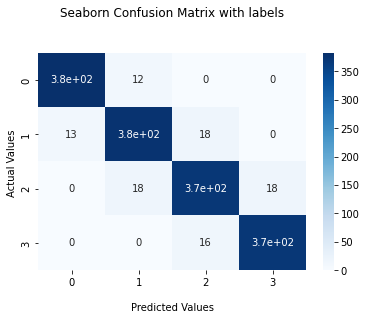

In [148]:
# visulize the confusion matrix for  test.
ax = sns.heatmap(cf4, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

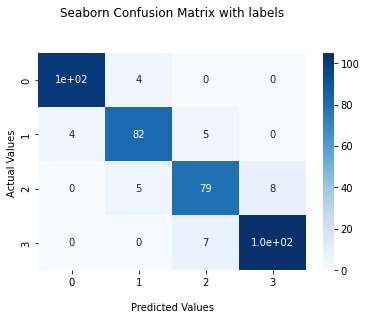

In [149]:
# visulize the confusion matrix for  test.
ax = sns.heatmap(cf5, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()
     

###Which hyperparameter optimization technique have you used and why?

To find the best hyperparameters values we can try the Manual Search method by using the hit and trial process and can find the best hyperparameters which would take huge time.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset


precision of 97% and recall of 97% and f1-score of 97% for low cost mobile.

precision of 93% and recall of 92% and f1-score of 93% for medium cost mobile.

precision of 92% and recall of 91% and f1-score of 91% for high cost mobile.

precision of 95% and recall of 96% and f1-score of 96% for very high cost mobile.

Accuracy is 94% and average percision, recall & f1_score are 94%, 94% and 94% respectively .

For testing dataset


precision of 96% and recall of 91% and f1-score of 96% for low cost mobile.

precision of 90% and recall of 85% and f1-score of 90% for medium cost mobile.

precision of 87% and recall of 82% and f1-score of 86% for high cost mobile.

precision of 93% and recall of 90% and f1-score of 93% for very high cost mobile.

Accuracy is 92% and average percision, recall & f1_score are 92%, 91% and 91% respectively .

Train accuarcy has been reduced to 96% from 94% and test accuarcy is increased to 92% from 85% . Thus we somewhat reduced the overfiiting by reducing the training accuarcy. However this will be good model for us.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

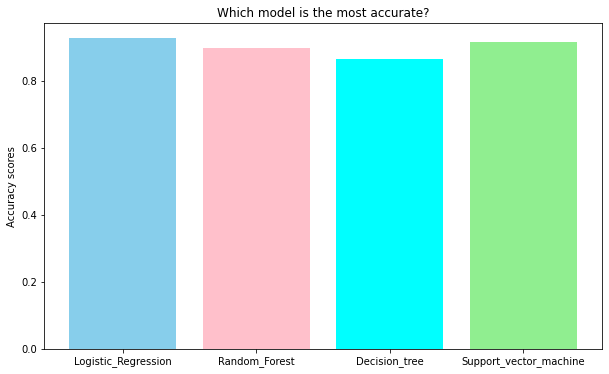

In [150]:
models = ['Logistic_Regression', 'Random_Forest','Decision_tree','Support_vector_machine']
new_acc_scores = [tune_test_accur1,tune_test_accur2,tune_test_accur4,tune_test_accur5]
old_acc_scores=[test_accur1,test_accur2,test_accur4,test_accur5]

plt.figure(figsize=(10,6))
plt.bar(models, new_acc_scores, color=['skyblue', 'pink', 'cyan','lightgreen'])
plt.ylabel("Accuracy scores")
plt.title("Which model is the most accurate?")
plt.show()

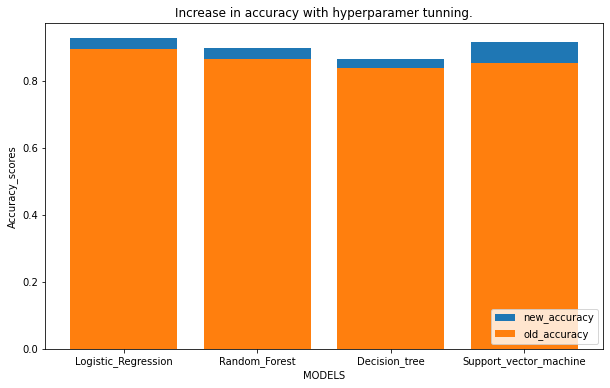

In [151]:
new_acc_scores = [tune_test_accur1,tune_test_accur2,tune_test_accur4,tune_test_accur5]
old_acc_scores=[test_accur1,test_accur2,test_accur4,test_accur5]

fig, ax = plt.subplots(figsize=(10,6))

ax.bar(models,new_acc_scores)
ax.bar(models,old_acc_scores)

ax.set_title('Increase in accuracy with hyperparamer tunning.')
ax.set_xlabel('MODELS')    
ax.set_ylabel('Accuracy_scores')    
ax.legend(labels=['new_accuracy','old_accuracy'],loc=4)

plt.show()


After training our dataset with four different models, we conclude that logistic_regression is best model for our dataset. (via the highest accuracy score = 0.93%)

In [152]:
# Accuracy of all models befor hyperparameter tuning

accuracy_dict={ "Model Name":["logistic_regression","Random_forest",
                "Decision_Tree_classifier",'Support_vector_machine'],
              "Traning Accuracy Score":[train_accur1,train_accur2,train_accur4,train_accur5],
               "Test Accuracy Score":[test_accur1,test_accur2,test_accur4,test_accur5]}

In [153]:
# Converting Dict into a Dataframe

accuracy_df=pd.DataFrame(accuracy_dict,index=[1,2,3,4])
accuracy_df.round({"Traning Accuracy Score":2, "Test Accuracy Score":2})

,Model Name,Traning Accuracy Score,Test Accuracy Score
1,logistic_regression,0.92,0.90
2,Random_forest,1.00,0.86
3,Decision_Tree_classifier,1.00,0.84
4,Support_vector_machine,0.96,0.86


In [154]:
# Accuracy of all models after hyperparameter tuning.

accuracy_tuning_dict={ "Model Name":["logistic_regression","Random_forest",
                "Decision_Tree_classifier",'Support_vector_machine'],
                "Traning Accuracy Score":[tune_train_accur1,tune_train_accur2,tune_train_accur4,tune_train_accur5],
               "Test Accuracy Score":    [tune_test_accur1,tune_test_accur2,tune_test_accur4,tune_test_accur5]}

In [155]:
# Converting Tuning Dict into a Dataframe

accuracy_tuning_df=pd.DataFrame(accuracy_tuning_dict,index=[1,2,3,4,])
accuracy_tuning_df.round({"	Traning Accuracy Score":2, "Test Accuracy Score":2})

,Model Name,Traning Accuracy Score,Test Accuracy Score
1,logistic_regression,0.950625,0.93
2,Random_forest,1.000000,0.90
3,Decision_Tree_classifier,0.955000,0.86
4,Support_vector_machine,0.940625,0.92


### 3. Explain the model which you have used and the feature importance using any model explainability tool?

In [156]:
# importing shap

!pip install shap


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 575.9/575.9 KB 27.3 MB/s eta 0:00:00


In [157]:
from sklearn.tree import export_graphviz
import shap 
sns.set_style('darkgrid')

In [158]:

# compute SHAP values
explainer = shap.TreeExplainer(Rc)
shap_values = explainer.shap_values(X)


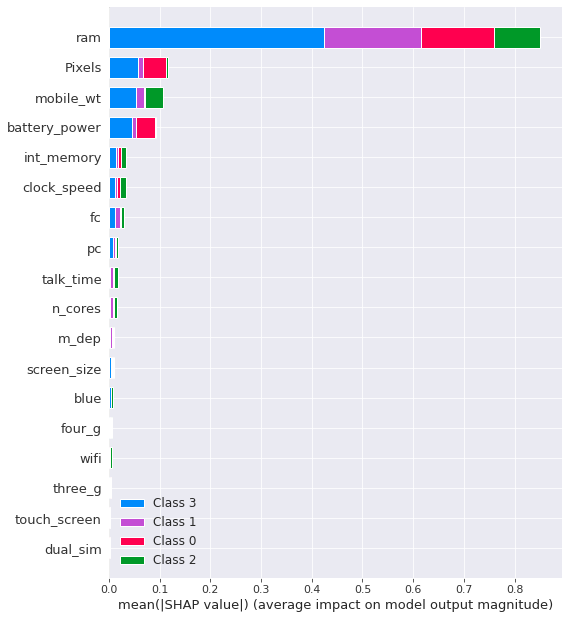

In [159]:
shap.summary_plot(shap_values, X.values, plot_type="bar", feature_names = X.columns)


In this above plot shows that ram is the most important features in predicting price range.

Among all the classes of price range class 3 gets most affected by the ram features.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [160]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [161]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**


We Started with Data understanding, data wrangling, basic EDA where we found the relationships, trends between price range and other independent variables.

From EDA we can see that here are mobile phones in 4 price ranges. The
number of elements is almost similar.

Half the devices have Bluetooth, and half don’t
there is a gradual increase in battery as the price range increases

Ram has continuous increase with price range while moving from Low cost to Very high cost

Costly phones are lighter

RAM, battery power, pixels played more significant role in deciding the price range of mobile phone.


Implemented various classification algorithms, out of which the logistic regression algorithm gave the best performance after hyper-parameter tuning with 95% train accuracy and 93 % test accuracy.

SVM is the second best good model which gave good performance after hyper-parameter tuning with 94% train accuracy and 92% test accuracy score. 

We checked for the feature importance's of each model. RAM, Battery Power, Px_height and px_width contributed the most while predicting the price range.
From all the above experiments we can conclude that in logistic regression we got the best results .

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***